## Medical segmentation on Kvasir dataset
https://datasets.simula.no/kvasir-seg/

------------------------

# 1. Prepare data

In [1]:
%%capture
!pip install opendatasets
!pip install torchsummary

In [2]:
import opendatasets as od

data_path = 'https://www.kaggle.com/datasets/abdallahwagih/kvasir-dataset-for-classification-and-segmentation'
od.download(data_path)
# You can use my account
# username: tanvanvan
# key: 17163508
# or use your own account information in settings, the information on your right hand

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

  tanvanvan


Your Kaggle Key:

  ········


Dataset URL: https://www.kaggle.com/datasets/abdallahwagih/kvasir-dataset-for-classification-and-segmentation


100%|██████████| 1.20G/1.20G [00:09<00:00, 138MB/s] 


In [3]:
image_paths = []
mask_paths = []
import os

images_root = './kvasir-dataset-for-classification-and-segmentation/kvasir-seg/Kvasir-SEG/images'
masks_root = './kvasir-dataset-for-classification-and-segmentation/kvasir-seg/Kvasir-SEG/masks'

for image, mask in zip(os.listdir(images_root), os.listdir(masks_root)):
    image_paths.append(os.path.join(images_root, image))
    mask_paths.append(os.path.join(masks_root, mask))

### Try converting images and masks to their true channel and check number of channels of images and masks

In [4]:
from PIL import Image

print('Image: ', Image.open(image_paths[0]).convert('RGB').getbands())
print('Mask: ', Image.open(mask_paths[0]).convert('L').getbands())

Image:  ('R', 'G', 'B')
Mask:  ('L',)


### Check the shape of images and masks

In [5]:
import numpy as np

print('Images: ', np.array(Image.open(image_paths[0]).convert('RGB')).shape)
print('Masks: ', np.array(Image.open(mask_paths[0]).convert('L')).shape)

Images:  (530, 622, 3)
Masks:  (530, 622)


### Show examples of data

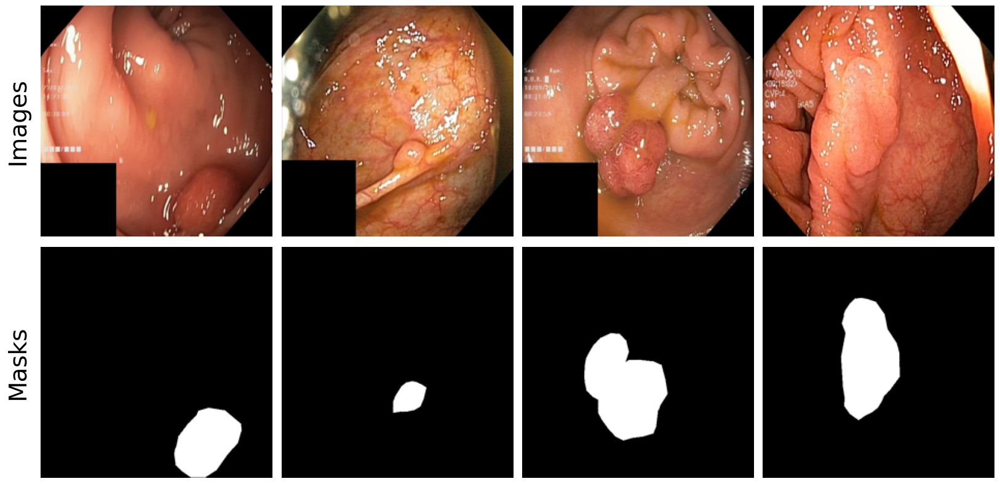

In [6]:
import matplotlib.pyplot as plt

# Assuming image_paths and mask_paths are lists of your image and mask paths respectively
n = 4 # number of images/masks

fig, axs = plt.subplots(2, n, figsize=(n*5, 10))  # Create a grid of 2 rows and n columns

for i in range(n):
    image = Image.open(image_paths[i]).convert('RGB')
    image = image.resize((224, 224))  # Resize image
    axs[0, i].imshow(image)  # Display images in the first row
    axs[0, i].axis('off')  # Hide axes

    mask = Image.open(mask_paths[i]).convert('L')
    mask = mask.resize((224, 224))  # Resize mask
    axs[1, i].imshow(mask, cmap='gray')  # Display masks in the second row
    axs[1, i].axis('off')  # Hide axes

# Add titles to the head of each row
plt.text(-0.15, 0.5, 'Images', va='center', rotation='vertical', transform=axs[0, 0].transAxes, fontsize=28)
plt.text(-0.15, 0.5, 'Masks', va='center', rotation='vertical', transform=axs[1, 0].transAxes, fontsize=28)

plt.subplots_adjust(wspace=0.04, hspace=0.04)  # Adjust the space between images
# plt.savefig('samples.png')
plt.show()

### Split data into three sets

In [7]:
from sklearn.model_selection import train_test_split
# seed = 0
val_size = 0.2
test_size = 0.25
is_shuffle = True

X_train, X_val, y_train, y_val = train_test_split(
    image_paths,
    mask_paths,
    test_size=val_size,
    random_state=42,
    shuffle=is_shuffle
)

X_train, X_test, y_train, y_test = train_test_split(
    X_train,
    y_train,
    test_size=test_size,
    random_state=42,
    shuffle=is_shuffle
)

print('Train: ', len(X_train))
print('Val: ', len(X_val))
print('Test: ', len(X_test))

Train:  600
Val:  200
Test:  200


### Create KvasirDataset

In [8]:
from torch.utils.data import Dataset, DataLoader

class KvasirDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]
        image = Image.open(image_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')
        
        if self.transform:
            image, mask = self.transform(image, mask)
            
        return image, mask

### Calculate mean and std of dataset

In [9]:
full_data = KvasirDataset(image_paths, mask_paths)
img_data = []
for img, _ in full_data:
    img_array = np.array(img.resize((224, 224))) / 255.0
    img_data.append(img_array)
    
img_data = np.array(img_data)

# Calculate mean and std
mean = np.mean(img_data, axis=(0, 1, 2))
std = np.std(img_data, axis=(0, 1, 2))

print('Mean: ', mean)
print('Std: ', std)

Mean:  [0.55714883 0.32170294 0.23581956]
Std:  [0.31774015 0.22082197 0.18651856]


### Data transform and augmentation

In [10]:
import torchvision.transforms as transforms
import torch

# Define a class transform for image and mask
class CustomTransform:
    def __init__(self, image_transform, mask_transform):
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __call__(self, image, mask):
        seed = torch.random.initial_seed()
        torch.manual_seed(seed)
        image = self.image_transform(image)

        torch.manual_seed(seed)
        mask = self.mask_transform(mask)

        return image, mask

# Tranforms for both image and mask (geometry transforms) for training
common_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
#     transforms.RandomHorizontalFlip(),
#     transforms.RandomVerticalFlip(),
#     transforms.RandomRotation(degrees=2.5),
#     transforms.RandomAffine(degrees=1, shear=1),
])
# Train Image transforms
train_image_transforms = transforms.Compose([
    common_transforms,
    # color transform
#     transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4),
#     transforms.GaussianBlur(3),

    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])
# Train Mask Transforms
train_mask_transforms = transforms.Compose([
    common_transforms,
    
    transforms.ToTensor(),
    transforms.Lambda(lambda x: torch.round(x))  # make the mask become binary
])
# Val Image transforms
val_image_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])
# Val Mask transforms
val_mask_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: torch.round(x))  # make the mask become binary
])
# transforms dictionary
data_transforms = {
    'train': CustomTransform(train_image_transforms, train_mask_transforms),
    'val': CustomTransform(val_image_transforms, val_mask_transforms),
}

### Create dataset

In [11]:
train_dataset = KvasirDataset(
    X_train,
    y_train,
    transform=data_transforms['train']
)

val_dataset = KvasirDataset(
    X_val,
    y_val,
    transform=data_transforms['val']
)

test_dataset = KvasirDataset(
    X_test,
    y_test,
    transform=data_transforms['val']
)

### Make dataloader

In [12]:
train_batch_size = 8
test_batch_size = 4

train_loader = DataLoader(
    train_dataset,
    batch_size=train_batch_size,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=test_batch_size,
    shuffle=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=test_batch_size,
    shuffle=False
)

### Show batch

In [13]:
import torchvision

train_features, train_labels = next(iter(train_loader))

# use torchvision to display a grid of images
def show_batch(images, masks):
    grid_images = torchvision.utils.make_grid(images, nrow=4, normalize=True)
    grid_masks = torchvision.utils.make_grid(masks, nrow=4, normalize=True)

    plt.figure(figsize=(20, 20))
    plt.imshow(np.transpose(grid_images, (1, 2, 0)), )
    plt.show()
    
    plt.figure(figsize=(20, 20))
    plt.imshow(np.transpose(grid_masks, (1, 2, 0)), )
    plt.show()

In [14]:
train_features[0].shape

torch.Size([3, 224, 224])

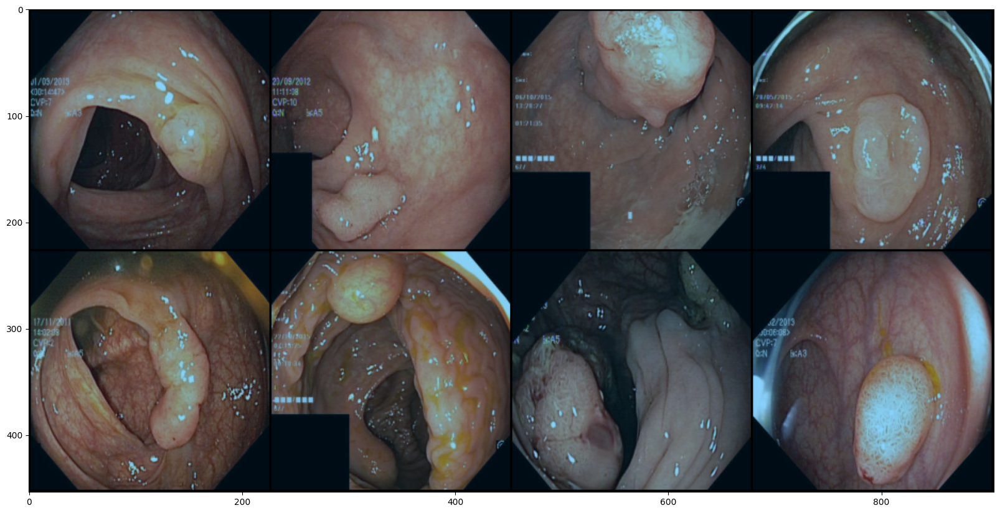

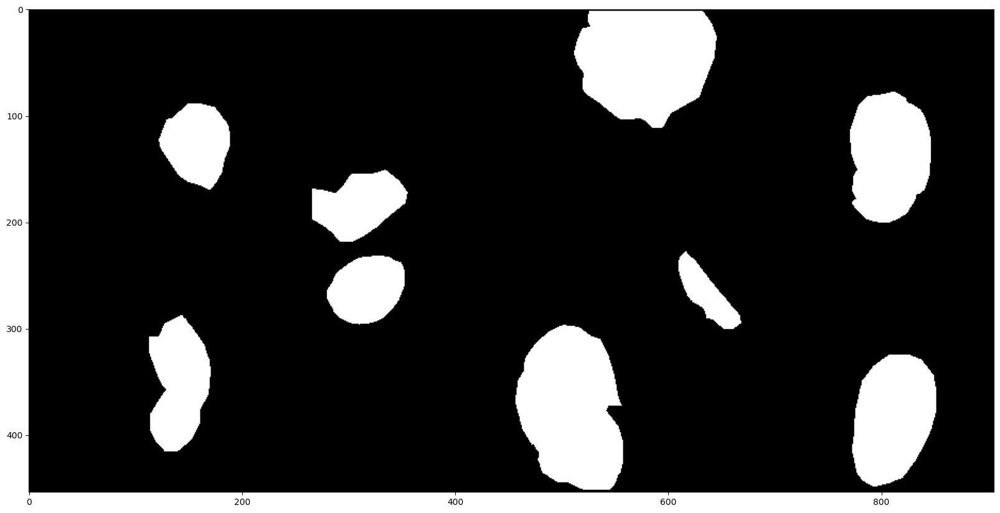

In [15]:
show_batch(train_features, train_labels)

In [16]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# 2. Model
Code: https://github.com/ternaus/angiodysplasia-segmentation

In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [18]:
def conv3x3(in_, out):
    return nn.Conv2d(in_, out, 3, padding=1)


class ConvRelu(nn.Module):
    def __init__(self, in_: int, out: int):
        super().__init__()
        self.conv = conv3x3(in_, out)
        self.activation = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.activation(x)
        return x


class DecoderBlock(nn.Module):
    def __init__(self, in_channels, middle_channels, out_channels, is_deconv=True):
        super(DecoderBlock, self).__init__()
        self.in_channels = in_channels

        if is_deconv:
            self.block = nn.Sequential(
                ConvRelu(in_channels, middle_channels),
                nn.ConvTranspose2d(middle_channels, out_channels, kernel_size=4, stride=2,
                                   padding=1),
                nn.ReLU(inplace=True)
            )
        else:
            self.block = nn.Sequential(
                nn.Upsample(scale_factor=2, mode='bilinear'),
                ConvRelu(in_channels, middle_channels),
                ConvRelu(middle_channels, out_channels),
            )

    def forward(self, x):
        return self.block(x)


class UNet11(nn.Module):
    def __init__(self, num_classes=1, num_filters=32, pretrained=False, is_deconv=False):
        """
        :param num_classes:
        :param num_filters:
        :param pretrained:
            False - no pre-trained network used
            vgg - encoder pre-trained with VGG11
        """
        super().__init__()
        self.pool = nn.MaxPool2d(2, 2)

        self.num_classes = num_classes
        
        if pretrained:
            self.encoder = models.vgg11(weights=models.vgg.VGG11_Weights.DEFAULT).features
        else:
            self.encoder = models.vgg11().features
        

        self.relu = nn.ReLU(inplace=True)
        self.conv1 = nn.Sequential(self.encoder[0],
                                   self.relu)

        self.conv2 = nn.Sequential(self.encoder[3],
                                   self.relu)

        self.conv3 = nn.Sequential(
            self.encoder[6],
            self.relu,
            self.encoder[8],
            self.relu,
        )
        self.conv4 = nn.Sequential(
            self.encoder[11],
            self.relu,
            self.encoder[13],
            self.relu,
        )

        self.conv5 = nn.Sequential(
            self.encoder[16],
            self.relu,
            self.encoder[18],
            self.relu,
        )

        self.center = DecoderBlock(256 + num_filters * 8, num_filters * 8 * 2, num_filters * 8, is_deconv=is_deconv)
        self.dec5 = DecoderBlock(512 + num_filters * 8, num_filters * 8 * 2, num_filters * 8, is_deconv=is_deconv)
        self.dec4 = DecoderBlock(512 + num_filters * 8, num_filters * 8 * 2, num_filters * 4, is_deconv=is_deconv)
        self.dec3 = DecoderBlock(256 + num_filters * 4, num_filters * 4 * 2, num_filters * 2, is_deconv=is_deconv)
        self.dec2 = DecoderBlock(128 + num_filters * 2, num_filters * 2 * 2, num_filters, is_deconv=is_deconv)
        self.dec1 = ConvRelu(64 + num_filters, num_filters)

        self.final = nn.Conv2d(num_filters, num_classes, kernel_size=1)

    def forward(self, x):
        conv1 = self.conv1(x)
        conv2 = self.conv2(self.pool(conv1))
        conv3 = self.conv3(self.pool(conv2))
        conv4 = self.conv4(self.pool(conv3))
        conv5 = self.conv5(self.pool(conv4))
        center = self.center(self.pool(conv5))

        dec5 = self.dec5(torch.cat([center, conv5], 1))
        dec4 = self.dec4(torch.cat([dec5, conv4], 1))
        dec3 = self.dec3(torch.cat([dec4, conv3], 1))
        dec2 = self.dec2(torch.cat([dec3, conv2], 1))
        dec1 = self.dec1(torch.cat([dec2, conv1], 1))

        if self.num_classes > 1:
            x_out = F.log_softmax(self.final(dec1), dim=1)
        else:
            x_out = self.final(dec1)

        return x_out

# Using VGG16 pretrained model    
class UNet16(nn.Module):
    def __init__(self, num_classes=1, num_filters=32, pretrained=False, is_deconv=False):
        """
        :param num_classes:
        :param num_filters:
        :param pretrained: if encoder uses pre-trained weigths from VGG16
        """
        super().__init__()
        self.num_classes = num_classes

        self.pool = nn.MaxPool2d(2, 2)

        if pretrained:
            self.encoder = models.vgg16(weights=models.vgg.VGG16_Weights.DEFAULT).features
        else:
            self.encoder = models.vgg16().features

        self.relu = nn.ReLU(inplace=True)

        self.conv1 = nn.Sequential(self.encoder[0],
                                   self.relu,
                                   self.encoder[2],
                                   self.relu)

        self.conv2 = nn.Sequential(self.encoder[5],
                                   self.relu,
                                   self.encoder[7],
                                   self.relu)

        self.conv3 = nn.Sequential(self.encoder[10],
                                   self.relu,
                                   self.encoder[12],
                                   self.relu,
                                   self.encoder[14],
                                   self.relu)

        self.conv4 = nn.Sequential(self.encoder[17],
                                   self.relu,
                                   self.encoder[19],
                                   self.relu,
                                   self.encoder[21],
                                   self.relu)

        self.conv5 = nn.Sequential(self.encoder[24],
                                   self.relu,
                                   self.encoder[26],
                                   self.relu,
                                   self.encoder[28],
                                   self.relu)

        self.center = DecoderBlock(512, num_filters * 8 * 2, num_filters * 8, is_deconv=is_deconv)

        self.dec5 = DecoderBlock(512 + num_filters * 8, num_filters * 8 * 2, num_filters * 8, is_deconv=is_deconv)
        self.dec4 = DecoderBlock(512 + num_filters * 8, num_filters * 8 * 2, num_filters * 8, is_deconv=is_deconv)
        self.dec3 = DecoderBlock(256 + num_filters * 8, num_filters * 4 * 2, num_filters * 2, is_deconv=is_deconv)
        self.dec2 = DecoderBlock(128 + num_filters * 2, num_filters * 2 * 2, num_filters, is_deconv=is_deconv)
        self.dec1 = ConvRelu(64 + num_filters, num_filters)
        self.final = nn.Conv2d(num_filters, num_classes, kernel_size=1)

    def forward(self, x):
        conv1 = self.conv1(x)
        conv2 = self.conv2(self.pool(conv1))
        conv3 = self.conv3(self.pool(conv2))
        conv4 = self.conv4(self.pool(conv3))
        conv5 = self.conv5(self.pool(conv4))

        center = self.center(self.pool(conv5))

        dec5 = self.dec5(torch.cat([center, conv5], 1))

        dec4 = self.dec4(torch.cat([dec5, conv4], 1))
        dec3 = self.dec3(torch.cat([dec4, conv3], 1))
        dec2 = self.dec2(torch.cat([dec3, conv2], 1))
        dec1 = self.dec1(torch.cat([dec2, conv1], 1))

        if self.num_classes > 1:
            x_out = F.log_softmax(self.final(dec1), dim=1)
        else:
            x_out = self.final(dec1)

        return x_out

In [19]:
from torchsummary import summary

model = UNet11(pretrained=True)
model.to(device)
summary(model, (3, 224, 224))

Downloading: "https://download.pytorch.org/models/vgg11-8a719046.pth" to /root/.cache/torch/hub/checkpoints/vgg11-8a719046.pth
100%|██████████| 507M/507M [00:08<00:00, 59.9MB/s] 


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
            Conv2d-2         [-1, 64, 224, 224]           1,792
              ReLU-3         [-1, 64, 224, 224]               0
              ReLU-4         [-1, 64, 224, 224]               0
              ReLU-5         [-1, 64, 224, 224]               0
              ReLU-6         [-1, 64, 224, 224]               0
              ReLU-7         [-1, 64, 224, 224]               0
              ReLU-8         [-1, 64, 224, 224]               0
         MaxPool2d-9         [-1, 64, 112, 112]               0
           Conv2d-10        [-1, 128, 112, 112]          73,856
           Conv2d-11        [-1, 128, 112, 112]          73,856
             ReLU-12        [-1, 128, 112, 112]               0
             ReLU-13        [-1, 128, 112, 112]               0
             ReLU-14        [-1, 128, 1

## IOU metric

For quality assessment, we will use the IoU (intersection over union) metric defined as:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

### Examples:
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


#### Intersection and union:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [20]:
def iou_pytorch(outputs, labels):
    outputs = outputs.squeeze().byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels =(labels).squeeze().byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zero if both are 0
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    return iou

## Loss function

To start the training of our model, we will implement a loss function:\
**Binary cross-enthropy loss (BCE)**

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

where $y$ is our target and $\hat y$ is an output of the model. $\sigma$ is a logistic function 



In [21]:
import torch.nn as nn

nn.BCEWithLogitsLoss()

BCEWithLogitsLoss()

# 3. Train

In [22]:
# Function to denormalize image
def de_normalize(img, mean=mean, std=std):
    result = img * std + mean
    result = np.clip(result, 0.0, 1.0)
    
    return result

In [23]:
# Function to display the result
@torch.inference_mode()
def display_prediction(model, image, target):
    model.eval()
    img = image[None,...].to(device)
    output = model(img)
    pred = (torch.sigmoid(output.squeeze()) > 0.5).to(int)


    plt.figure(figsize=(10, 5))

    plt.subplot(1,3,1)
    plt.axis('off')
    plt.title("Input Image")
    plt.imshow(de_normalize(image.numpy().transpose(1,2,0)))

    plt.subplot(1,3,2)
    plt.axis('off')
    plt.title("Prediction")
    plt.imshow(pred.cpu().squeeze(), cmap='gray')

    plt.subplot(1,3,3)
    plt.axis('off')
    plt.title("Ground Truth")
    plt.imshow(target.numpy().transpose(1, 2, 0), cmap='gray')

    plt.show()

In [24]:
# Choose one set of image, mask in train set to display
idx = np.random.randint(0, len(train_dataset) - 1)
display_image = train_dataset[idx][0]
display_mask = train_dataset[idx][1]

In [25]:
# Function to evaluate model
def evaluate(model, val_loader, criterion):
    model.eval()
    val_loss = 0.0
    val_IOU = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            
            total += labels.size(0)
            predict_labels = (torch.sigmoid(outputs.squeeze()) > 0.5).to(int)
            val_IOU += iou_pytorch(predict_labels, labels).sum().item()

    val_loss = val_loss / len(val_loader)
    val_IOU = val_IOU / total
    return val_loss, val_IOU

In [26]:
def train(model, train_loader, val_loader, criterion, optimizer, max_epoch=50, output_path='best_model.pth'):
    # save progress
    train_losses = []
    val_losses = []
    train_IOUs = []
    val_IOUs = []
    best_IOU = 0.0
    
    # train
    for epoch in range(max_epoch):
        model.train()

        running_loss = 0.0
        running_IOU = 0
        total = 0
        
        for i, (inputs, labels) in enumerate(train_loader, 0):
            # Move inputs and labels to the device
            inputs, labels = inputs.to(device), labels.to(device) 

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            
            # Calculate IOU
            total += labels.size(0)
            predict_labels = (torch.sigmoid(outputs.squeeze()) > 0.5).to(int)

            running_IOU += iou_pytorch(predict_labels, labels).sum().item()

            # Backward pass and optimization
            loss.backward()
            optimizer.step()
            
        epoch_loss = running_loss / len(train_loader)
        epoch_IOU = running_IOU / total
        val_loss, val_IOU = evaluate(model, val_loader, criterion)
        # Save best model
        if val_IOU > best_IOU:
            best_IOU = val_IOU
            torch.save(model.state_dict(), output_path)
        
        print(f"Epoch [{epoch + 1}/{max_epoch}], Loss: {epoch_loss:.4f}, IOU: {epoch_IOU:.2f}, Val Loss: {val_loss:.4f}, Val IOU: {val_IOU:.2f}")
        display_prediction(model, display_image, display_mask)
        

        # save for plot
        train_losses.append(epoch_loss)
        train_IOUs.append(epoch_IOU)
        val_losses.append(val_loss)
        val_IOUs.append(val_IOU)
        
    return [train_losses, val_losses, train_IOUs, val_IOUs]
        

In [27]:
# Clear the GPU memory just in case

import gc
gc.collect()
torch.cuda.empty_cache()
torch.cuda.memory_allocated()

93678080

Epoch [1/50], Loss: 0.4147, IOU: 0.00, Val Loss: 0.2947, Val IOU: 0.00


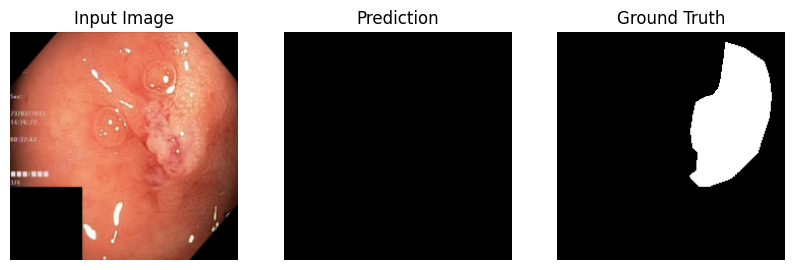

Epoch [2/50], Loss: 0.2441, IOU: 0.17, Val Loss: 0.2201, Val IOU: 0.56


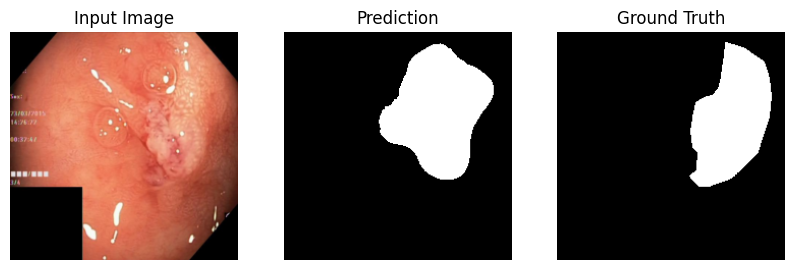

Epoch [3/50], Loss: 0.1669, IOU: 0.61, Val Loss: 0.1786, Val IOU: 0.64


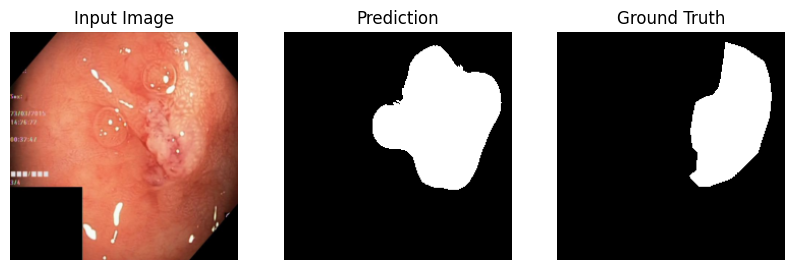

Epoch [4/50], Loss: 0.1280, IOU: 0.68, Val Loss: 0.1698, Val IOU: 0.66


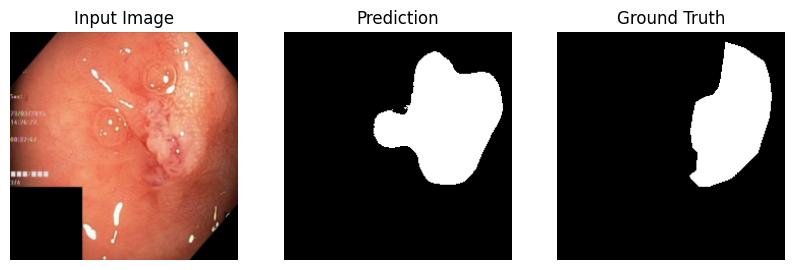

Epoch [5/50], Loss: 0.0939, IOU: 0.75, Val Loss: 0.1736, Val IOU: 0.68


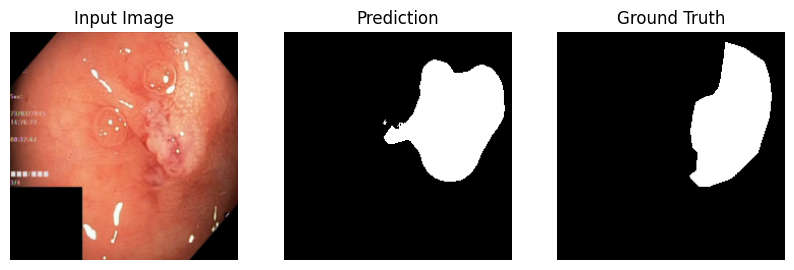

Epoch [6/50], Loss: 0.0653, IOU: 0.81, Val Loss: 0.2041, Val IOU: 0.69


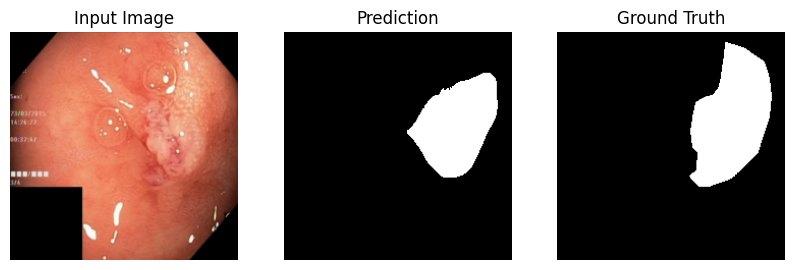

Epoch [7/50], Loss: 0.0914, IOU: 0.78, Val Loss: 0.1978, Val IOU: 0.68


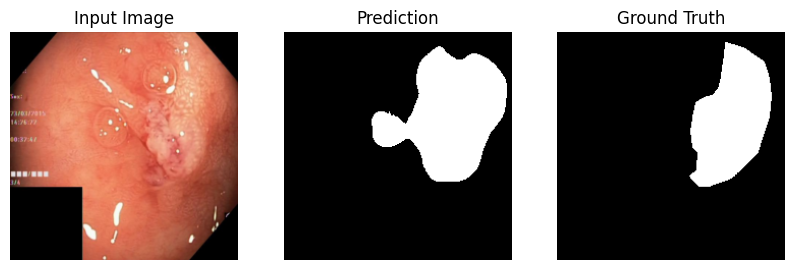

Epoch [8/50], Loss: 0.0705, IOU: 0.81, Val Loss: 0.2115, Val IOU: 0.67


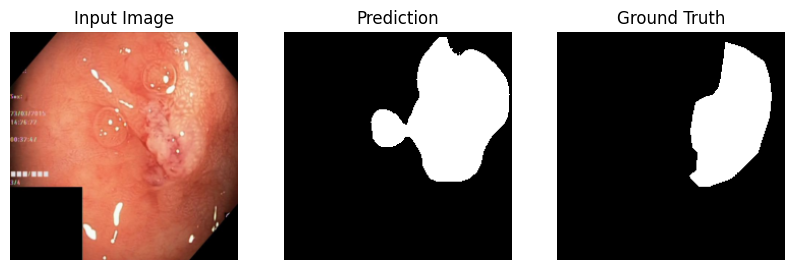

Epoch [9/50], Loss: 0.0636, IOU: 0.81, Val Loss: 0.1599, Val IOU: 0.72


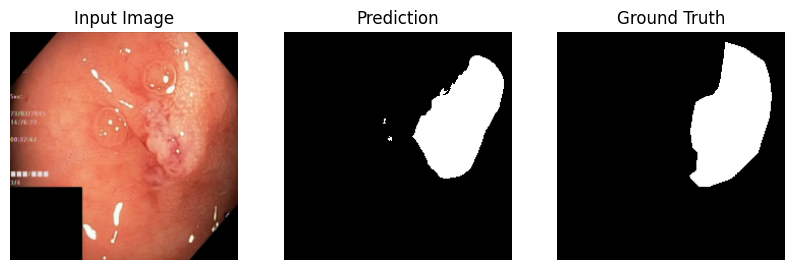

Epoch [10/50], Loss: 0.0607, IOU: 0.83, Val Loss: 0.3025, Val IOU: 0.66


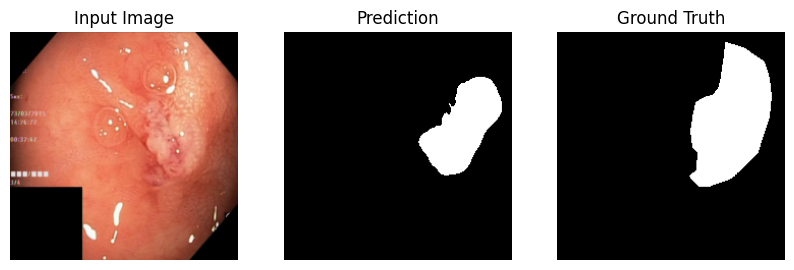

Epoch [11/50], Loss: 0.0457, IOU: 0.86, Val Loss: 0.2271, Val IOU: 0.72


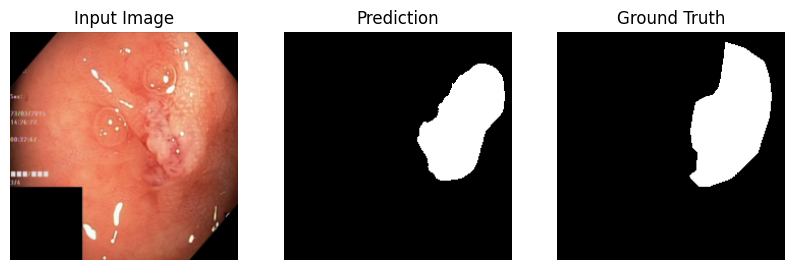

Epoch [12/50], Loss: 0.0420, IOU: 0.87, Val Loss: 0.1857, Val IOU: 0.71


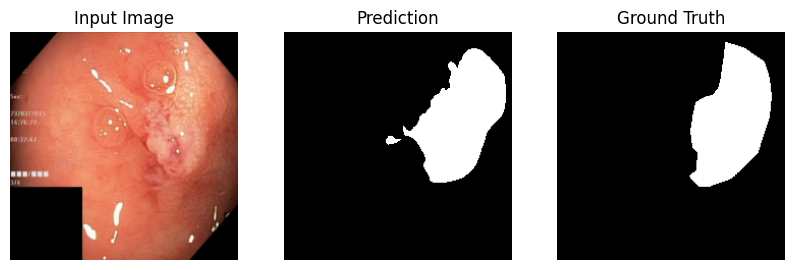

Epoch [13/50], Loss: 0.0414, IOU: 0.88, Val Loss: 0.1754, Val IOU: 0.69


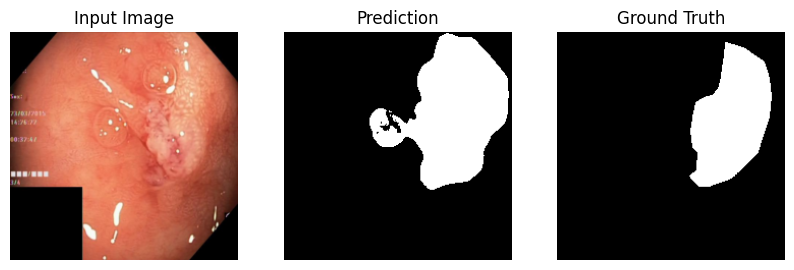

Epoch [14/50], Loss: 0.0328, IOU: 0.89, Val Loss: 0.1989, Val IOU: 0.74


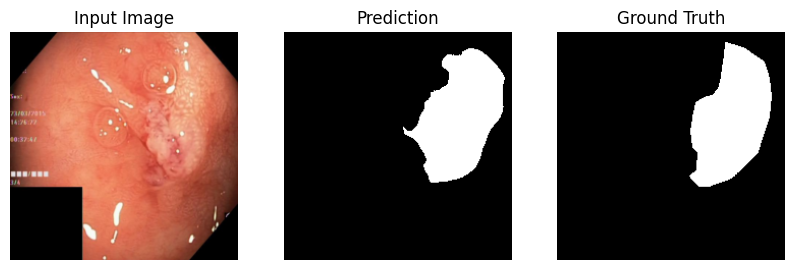

Epoch [15/50], Loss: 0.0291, IOU: 0.90, Val Loss: 0.3321, Val IOU: 0.73


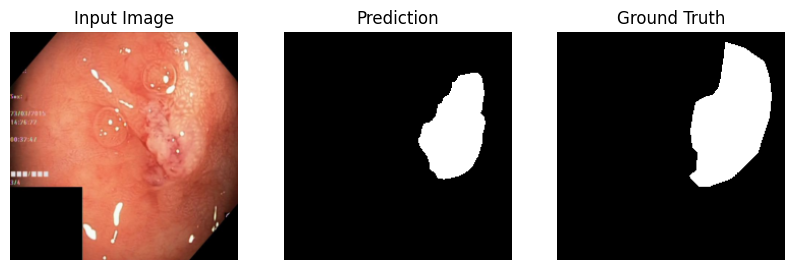

Epoch [16/50], Loss: 0.0278, IOU: 0.91, Val Loss: 0.3530, Val IOU: 0.73


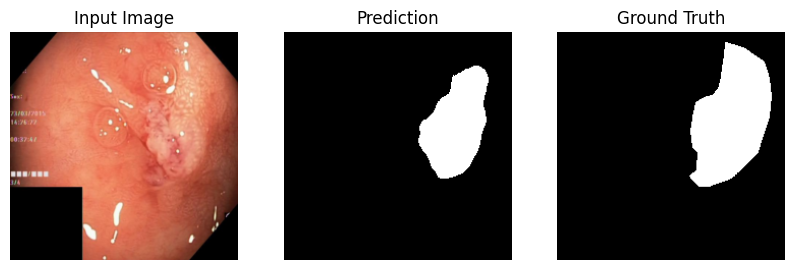

Epoch [17/50], Loss: 0.0282, IOU: 0.91, Val Loss: 0.3761, Val IOU: 0.72


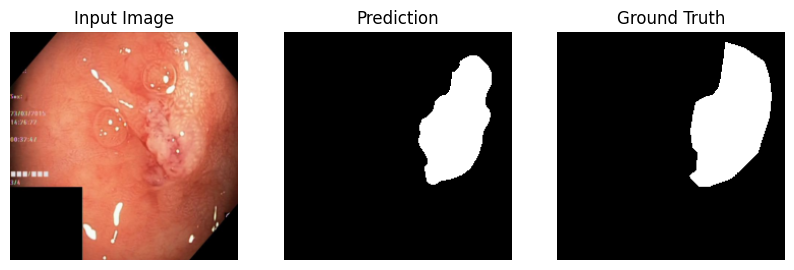

Epoch [18/50], Loss: 0.0276, IOU: 0.91, Val Loss: 0.4635, Val IOU: 0.69


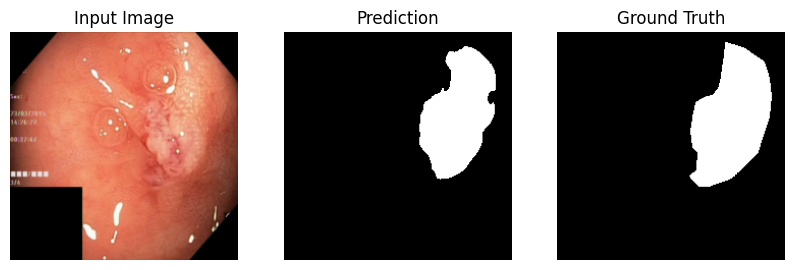

Epoch [19/50], Loss: 0.0264, IOU: 0.91, Val Loss: 0.3457, Val IOU: 0.73


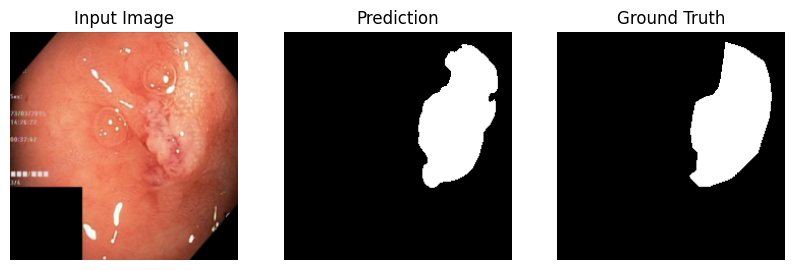

Epoch [20/50], Loss: 0.0234, IOU: 0.92, Val Loss: 0.2669, Val IOU: 0.75


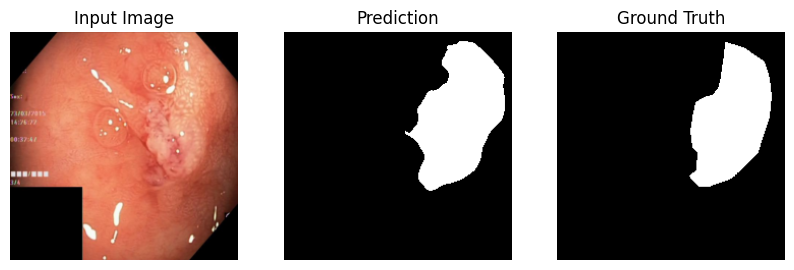

Epoch [21/50], Loss: 0.0192, IOU: 0.93, Val Loss: 0.3054, Val IOU: 0.74


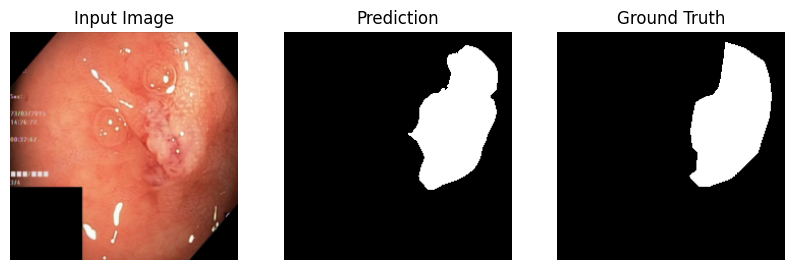

Epoch [22/50], Loss: 0.0176, IOU: 0.94, Val Loss: 0.3587, Val IOU: 0.75


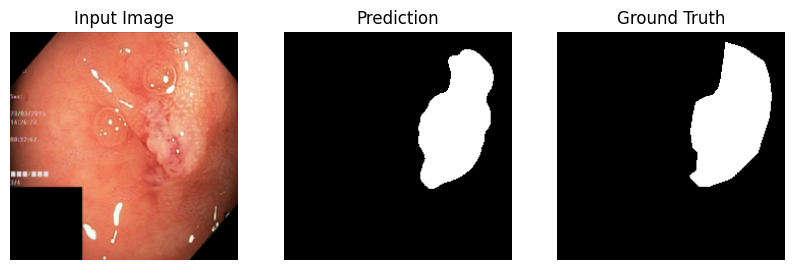

Epoch [23/50], Loss: 0.0159, IOU: 0.94, Val Loss: 0.4145, Val IOU: 0.74


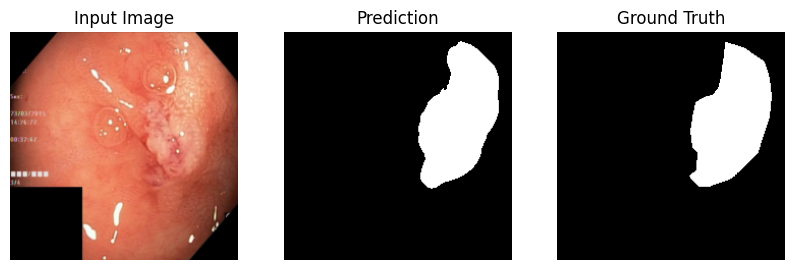

Epoch [24/50], Loss: 0.0149, IOU: 0.94, Val Loss: 0.4355, Val IOU: 0.74


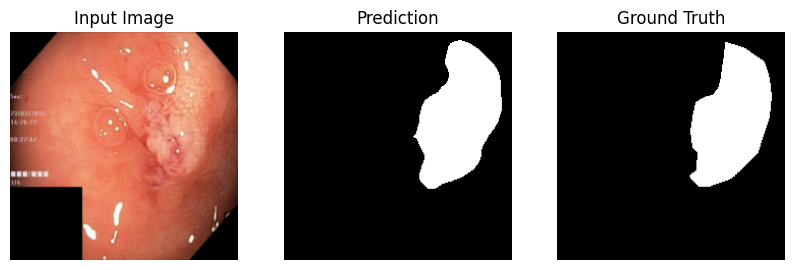

Epoch [25/50], Loss: 0.0143, IOU: 0.95, Val Loss: 0.4210, Val IOU: 0.74


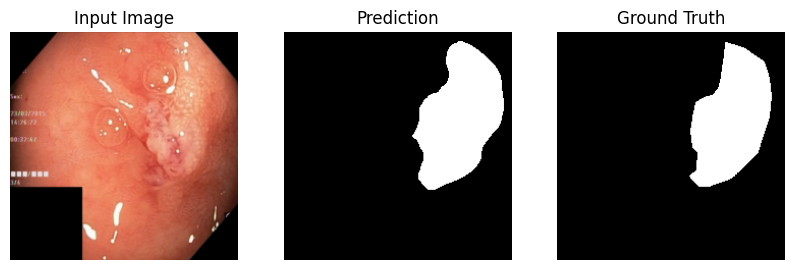

Epoch [26/50], Loss: 0.0140, IOU: 0.95, Val Loss: 0.3658, Val IOU: 0.74


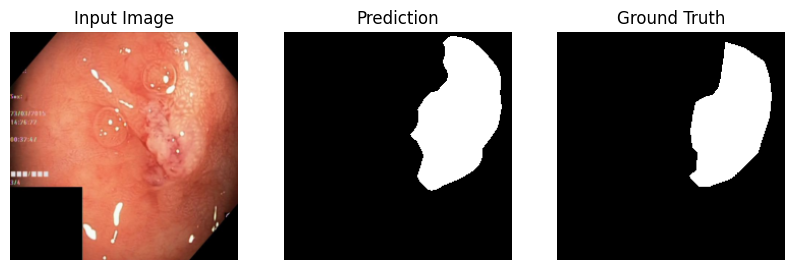

Epoch [27/50], Loss: 0.0139, IOU: 0.95, Val Loss: 0.3887, Val IOU: 0.74


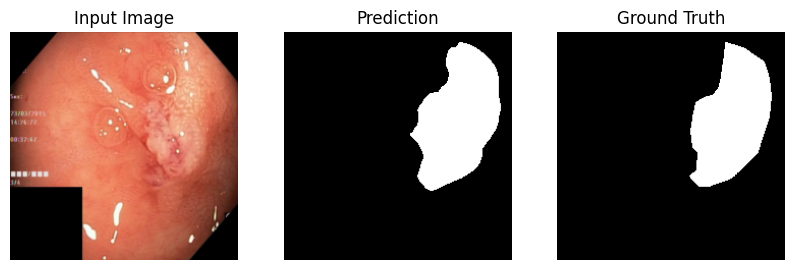

Epoch [28/50], Loss: 0.0149, IOU: 0.95, Val Loss: 0.3621, Val IOU: 0.74


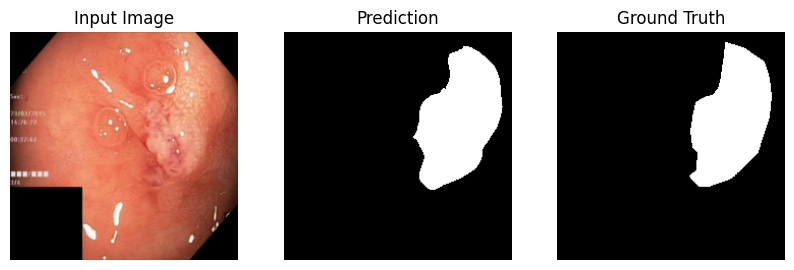

Epoch [29/50], Loss: 0.0158, IOU: 0.94, Val Loss: 0.2970, Val IOU: 0.73


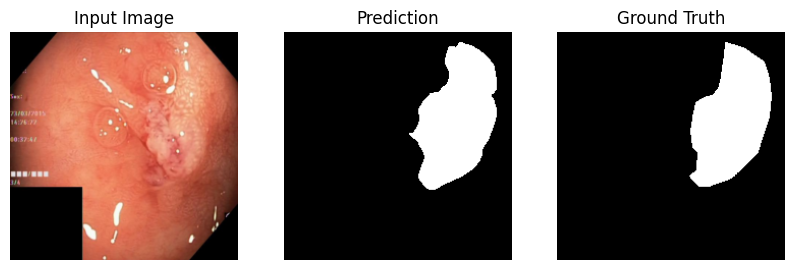

Epoch [30/50], Loss: 0.0165, IOU: 0.94, Val Loss: 0.3336, Val IOU: 0.75


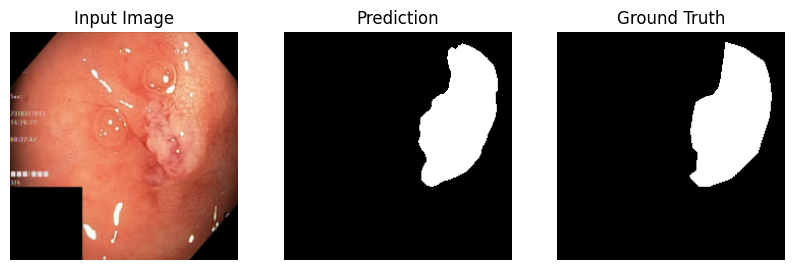

Epoch [31/50], Loss: 0.0172, IOU: 0.94, Val Loss: 0.5403, Val IOU: 0.72


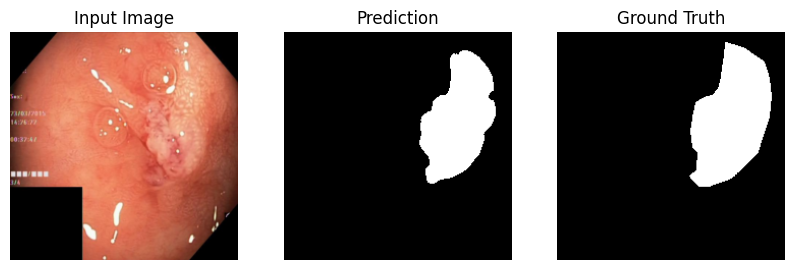

Epoch [32/50], Loss: 0.0198, IOU: 0.93, Val Loss: 0.6808, Val IOU: 0.68


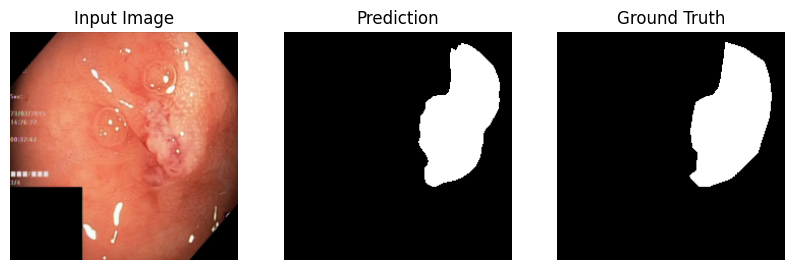

Epoch [33/50], Loss: 0.0395, IOU: 0.90, Val Loss: 0.2609, Val IOU: 0.74


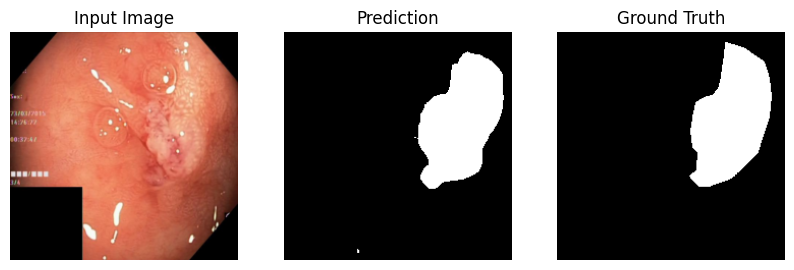

Epoch [34/50], Loss: 0.0210, IOU: 0.93, Val Loss: 0.3835, Val IOU: 0.73


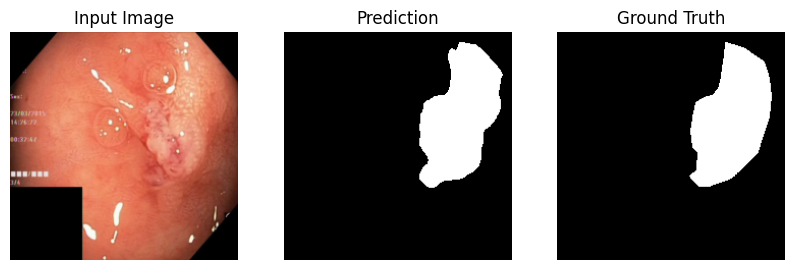

Epoch [35/50], Loss: 0.0168, IOU: 0.94, Val Loss: 0.3020, Val IOU: 0.75


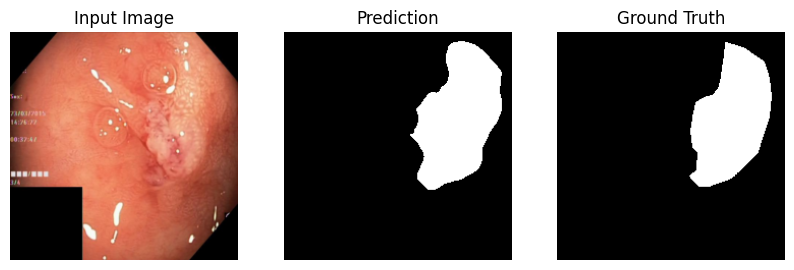

Epoch [36/50], Loss: 0.0148, IOU: 0.95, Val Loss: 0.3432, Val IOU: 0.74


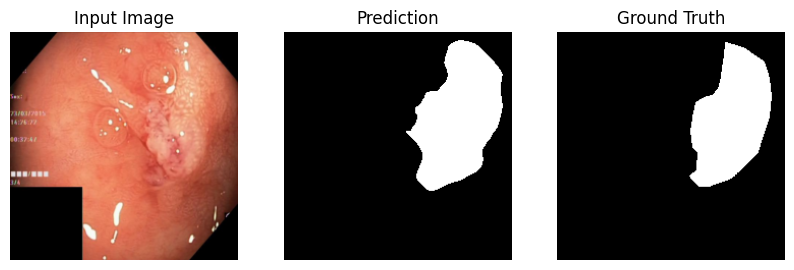

Epoch [37/50], Loss: 0.0134, IOU: 0.95, Val Loss: 0.3634, Val IOU: 0.73


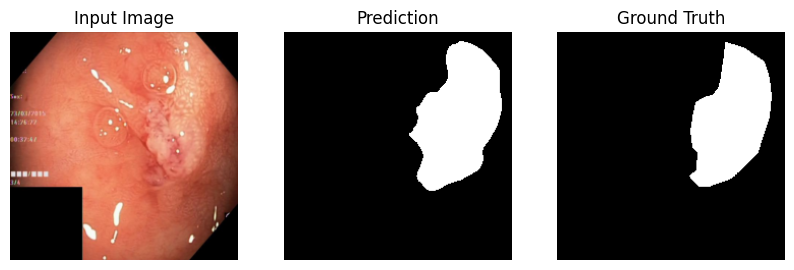

Epoch [38/50], Loss: 0.0130, IOU: 0.95, Val Loss: 0.3580, Val IOU: 0.74


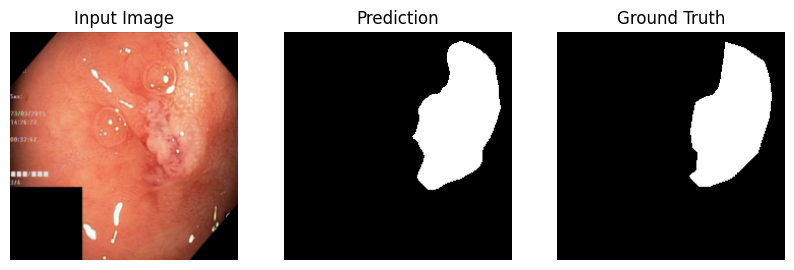

Epoch [39/50], Loss: 0.0128, IOU: 0.95, Val Loss: 0.4258, Val IOU: 0.75


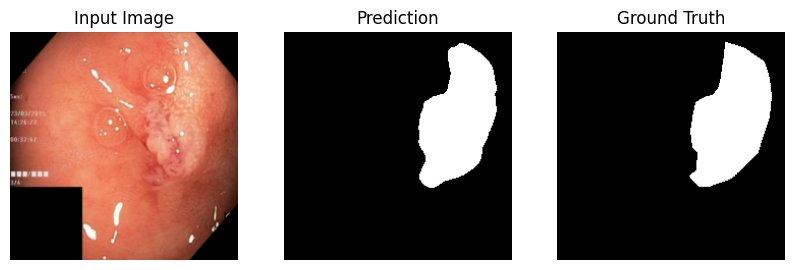

Epoch [40/50], Loss: 0.0135, IOU: 0.95, Val Loss: 0.5632, Val IOU: 0.73


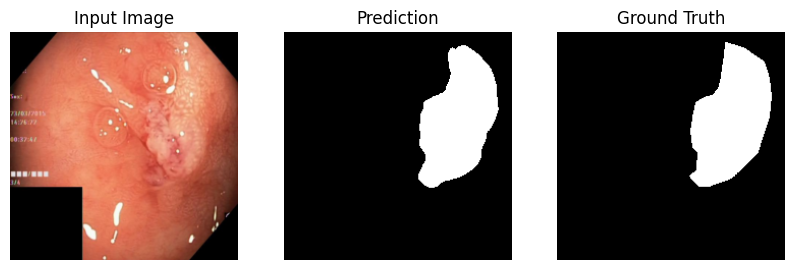

Epoch [41/50], Loss: 0.0154, IOU: 0.94, Val Loss: 0.3968, Val IOU: 0.75


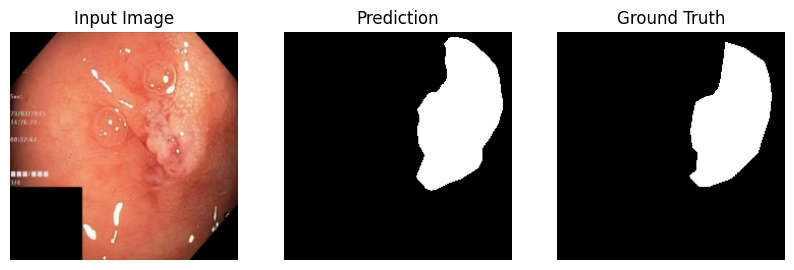

Epoch [42/50], Loss: 0.0143, IOU: 0.95, Val Loss: 0.3813, Val IOU: 0.73


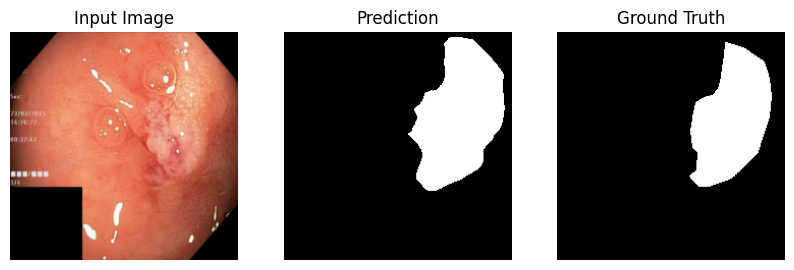

Epoch [43/50], Loss: 0.0130, IOU: 0.95, Val Loss: 0.3774, Val IOU: 0.74


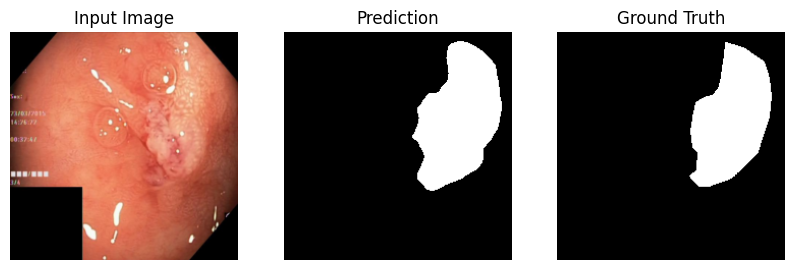

Epoch [44/50], Loss: 0.0121, IOU: 0.95, Val Loss: 0.4915, Val IOU: 0.75


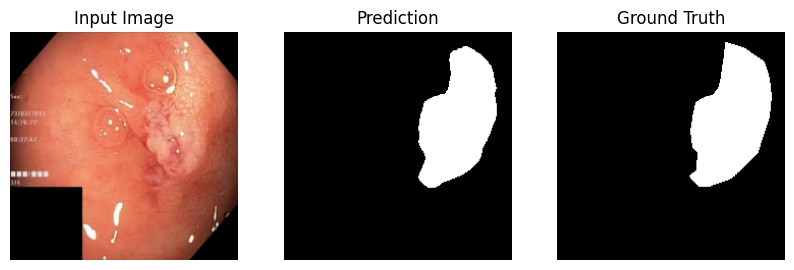

Epoch [45/50], Loss: 0.0119, IOU: 0.95, Val Loss: 0.5995, Val IOU: 0.74


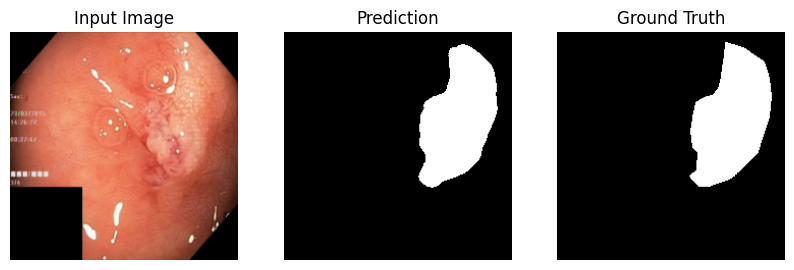

Epoch [46/50], Loss: 0.0132, IOU: 0.95, Val Loss: 0.5211, Val IOU: 0.74


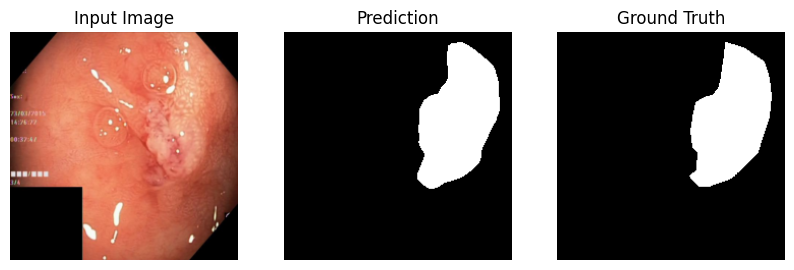

Epoch [47/50], Loss: 0.0136, IOU: 0.95, Val Loss: 0.3758, Val IOU: 0.75


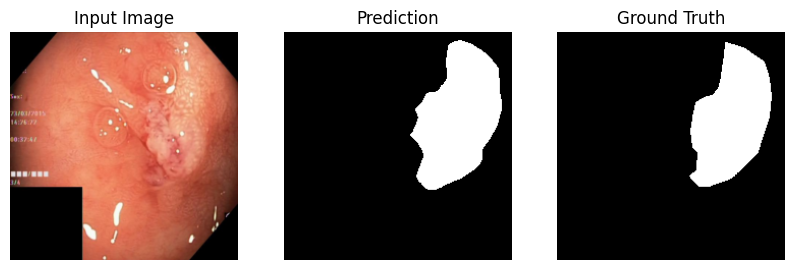

Epoch [48/50], Loss: 0.0118, IOU: 0.96, Val Loss: 0.3944, Val IOU: 0.75


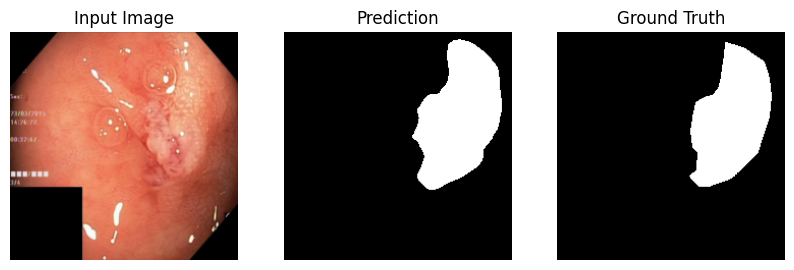

Epoch [49/50], Loss: 0.0112, IOU: 0.96, Val Loss: 0.5019, Val IOU: 0.75


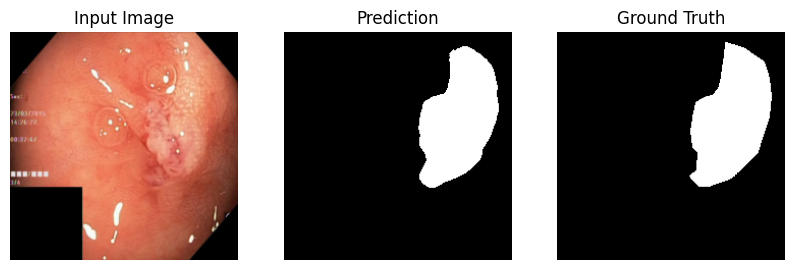

Epoch [50/50], Loss: 0.0105, IOU: 0.96, Val Loss: 0.7879, Val IOU: 0.74


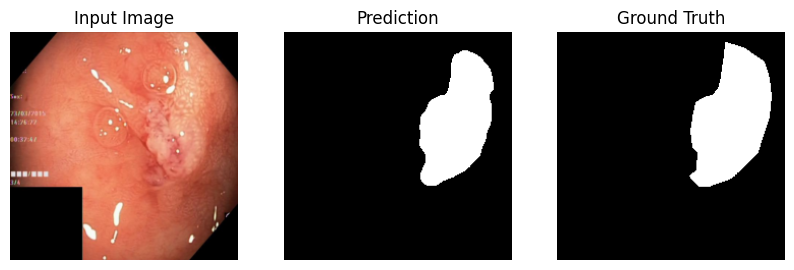

In [28]:
max_epoch = 50
lr = 4e-5
weight_decay = 1e-4
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay = weight_decay)
history_bce = train(model, train_loader, val_loader, criterion, optimizer, max_epoch, 'best_unet11_model.pth')

### Load the best model for testing

In [29]:
model.load_state_dict(torch.load('best_unet11_model.pth'))

<All keys matched successfully>

### Visualization of the training process

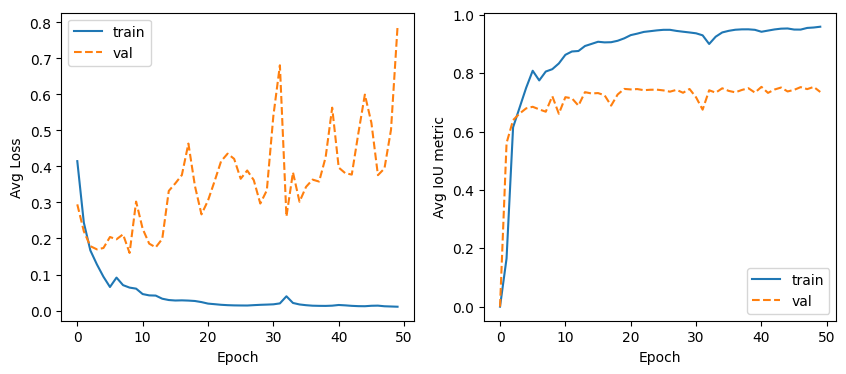

In [30]:
import pickle

# Function that will plot IoU metric and loss over the training process and dump the training history to a file
def visualize_and_save(history, savename):
    loss_tr, loss_val, metric_tr, metric_val = history
    graphs = plt.figure(figsize = (10, 4))

    ax1 = plt.subplot(1,2,1)
    plt.plot(loss_tr, label='train')
    plt.plot(loss_val, label='val', linestyle='--')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Avg Loss')

    ax2 = plt.subplot(1,2,2)
    plt.plot(metric_tr, label='train')
    plt.plot(metric_val, label='val', linestyle='--')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Avg IoU metric')

    plt.show()

    # we save the training history for future use
    with open(savename, 'wb') as file:
        pickle.dump(history, file)

    
visualize_and_save(history_bce, 'history_bce_unet11')

# 4. Prediction and scoring

In [31]:
# Predict function which will return a predict mask
def predict(model, inputs):
    model.eval()  # testing mode
    with torch.no_grad():
        inputs = inputs.to(device)
        outputs = model(inputs)

        predict_labels = (torch.sigmoid(outputs.squeeze()) > 0.5).to(int)
            
    return predict_labels

In [32]:
# Function returns an IoU value over the dataset (training or validation)
def score_model(model, metric, loader):
    model.eval()  # testing mode
    scores = 0
    with torch.no_grad():
        for inputs, labels in loader:
            preds = predict(model, inputs)
            scores += metric(preds, labels.to(device)).mean().item()
    return scores / len(loader)

### Calculate IoU score on all of the validation data

In [33]:
val_iou_unet11 = round(score_model(model, iou_pytorch, val_loader),3)
val_iou_unet11

0.753

### Calculate IoU score on all of the test data

In [34]:
test_iou_unet11 = round(score_model(model, iou_pytorch, test_loader),3)
test_iou_unet11

0.781

## Another metric Dice mean

**Dice coefficient:** Dice cofficient is a popular loss function for object detection and segmentation and is defined as follows: 
$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

You can mention that numerator is the intersection of X and Y and denominator is the union of X and Y

In [35]:
def dice_coefficient(outputs, labels):
    outputs = outputs.squeeze().byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze().byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    total = (outputs + labels).float().sum((1, 2))  # Will be zero if both are 0

    dice = (2. * intersection + SMOOTH) / (total + SMOOTH)  # We smooth our division to avoid 0/0
    return dice

### Calculate Dice mean score on all of the val data

In [36]:
val_dice_unet11 = round(score_model(model, dice_coefficient, val_loader),3)
val_dice_unet11

0.832

### Calculate Dice mean score on all of the test data

In [37]:
test_dice_unet11 = round(score_model(model, dice_coefficient, test_loader),3)
test_dice_unet11

0.857

# 5. Enhance model (Using VGG16 architecture and pretrained weight)

In [38]:
model = UNet16(pretrained=True)
model.to(device)
summary(model, (3, 224, 224))

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 159MB/s]  


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
            Conv2d-2         [-1, 64, 224, 224]           1,792
              ReLU-3         [-1, 64, 224, 224]               0
              ReLU-4         [-1, 64, 224, 224]               0
              ReLU-5         [-1, 64, 224, 224]               0
              ReLU-6         [-1, 64, 224, 224]               0
              ReLU-7         [-1, 64, 224, 224]               0
              ReLU-8         [-1, 64, 224, 224]               0
            Conv2d-9         [-1, 64, 224, 224]          36,928
           Conv2d-10         [-1, 64, 224, 224]          36,928
             ReLU-11         [-1, 64, 224, 224]               0
             ReLU-12         [-1, 64, 224, 224]               0
             ReLU-13         [-1, 64, 224, 224]               0
             ReLU-14         [-1, 64, 2

In [39]:
# Clear the GPU memory just in case

import gc
gc.collect()
torch.cuda.empty_cache()
torch.cuda.memory_allocated()

490990592

Epoch [1/50], Loss: 0.4211, IOU: 0.02, Val Loss: 0.2690, Val IOU: 0.10


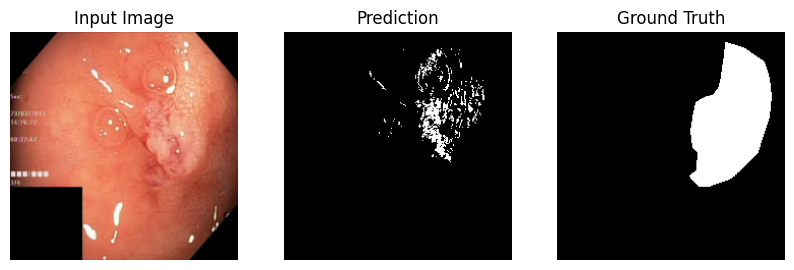

Epoch [2/50], Loss: 0.2354, IOU: 0.45, Val Loss: 0.2103, Val IOU: 0.60


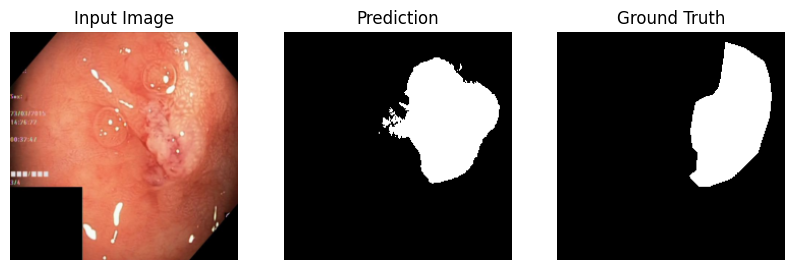

Epoch [3/50], Loss: 0.1686, IOU: 0.64, Val Loss: 0.1646, Val IOU: 0.65


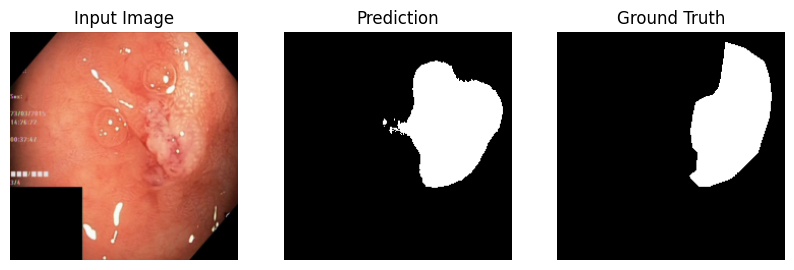

Epoch [4/50], Loss: 0.1118, IOU: 0.73, Val Loss: 0.1504, Val IOU: 0.69


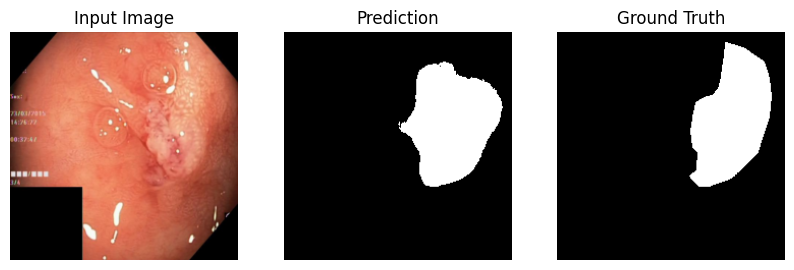

Epoch [5/50], Loss: 0.0790, IOU: 0.79, Val Loss: 0.1782, Val IOU: 0.68


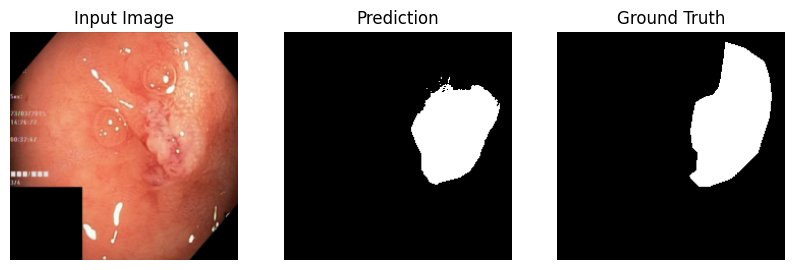

Epoch [6/50], Loss: 0.0694, IOU: 0.81, Val Loss: 0.1596, Val IOU: 0.72


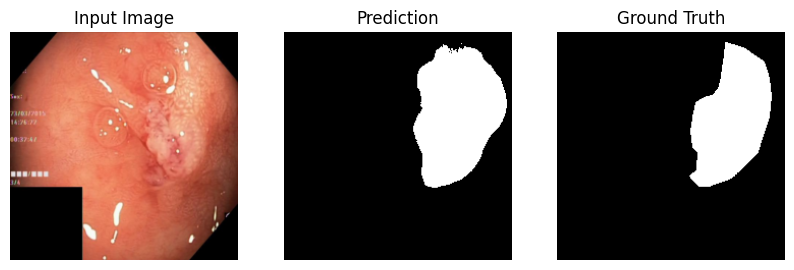

Epoch [7/50], Loss: 0.0633, IOU: 0.83, Val Loss: 0.1525, Val IOU: 0.72


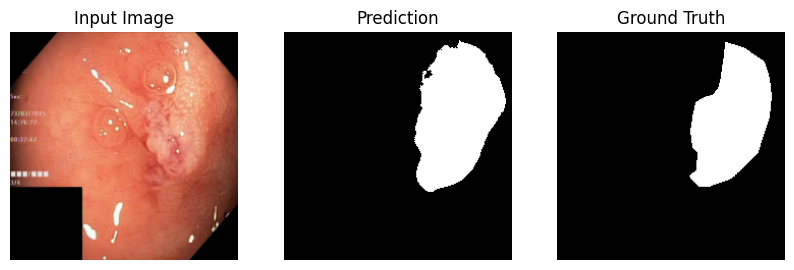

Epoch [8/50], Loss: 0.0595, IOU: 0.84, Val Loss: 0.1443, Val IOU: 0.72


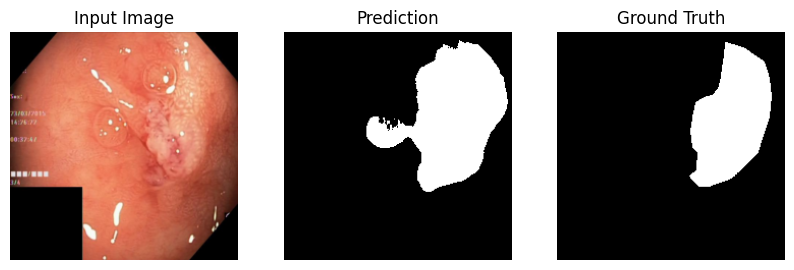

Epoch [9/50], Loss: 0.0803, IOU: 0.80, Val Loss: 0.1443, Val IOU: 0.74


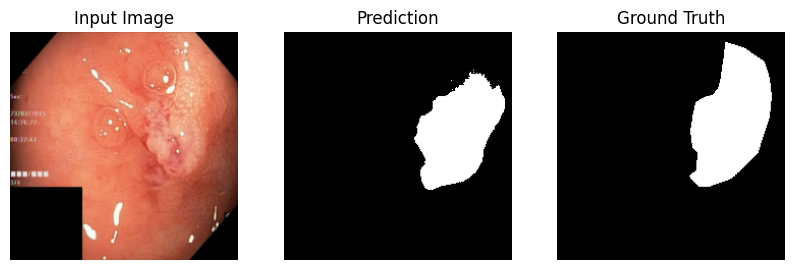

Epoch [10/50], Loss: 0.0827, IOU: 0.81, Val Loss: 0.1794, Val IOU: 0.75


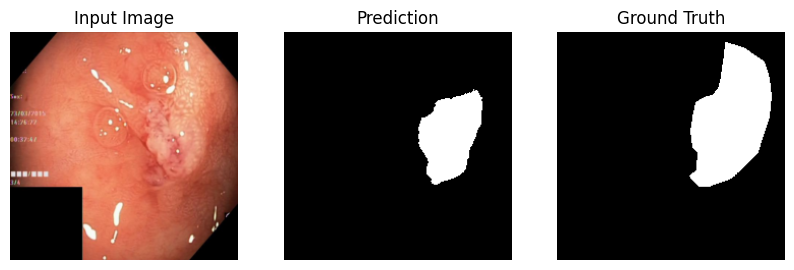

Epoch [11/50], Loss: 0.0423, IOU: 0.87, Val Loss: 0.1857, Val IOU: 0.77


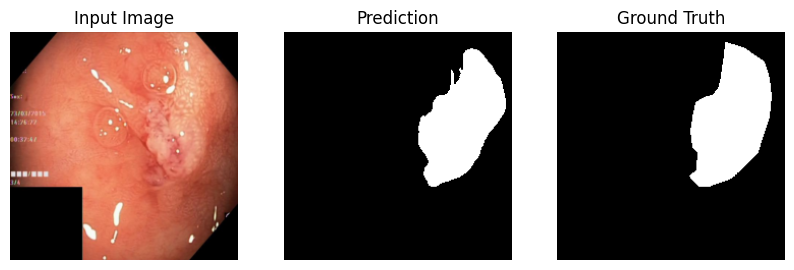

Epoch [12/50], Loss: 0.0302, IOU: 0.90, Val Loss: 0.1690, Val IOU: 0.76


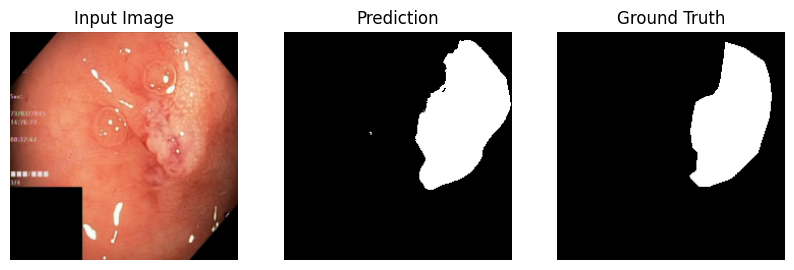

Epoch [13/50], Loss: 0.0249, IOU: 0.91, Val Loss: 0.2092, Val IOU: 0.77


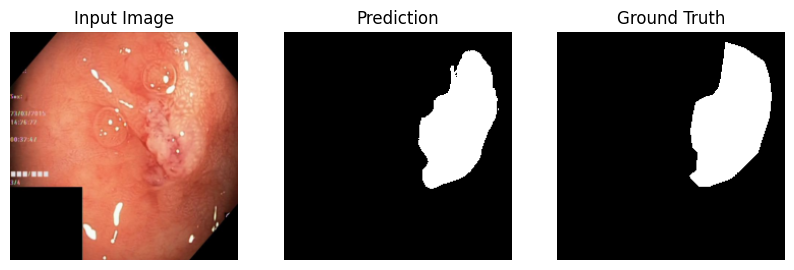

Epoch [14/50], Loss: 0.0227, IOU: 0.92, Val Loss: 0.2586, Val IOU: 0.76


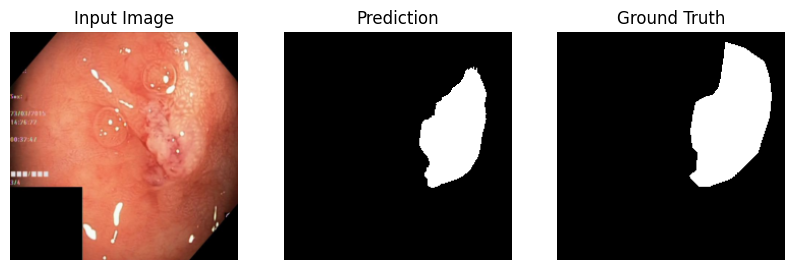

Epoch [15/50], Loss: 0.0226, IOU: 0.92, Val Loss: 0.2759, Val IOU: 0.77


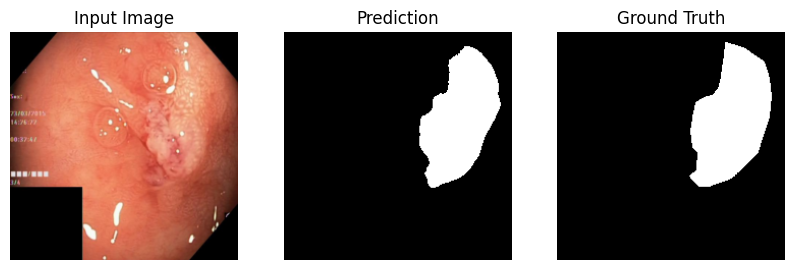

Epoch [16/50], Loss: 0.0206, IOU: 0.93, Val Loss: 0.3483, Val IOU: 0.75


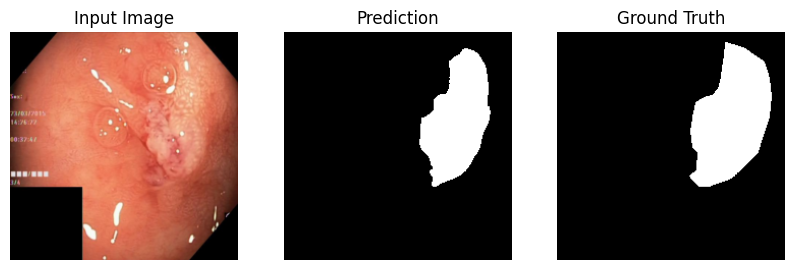

Epoch [17/50], Loss: 0.0205, IOU: 0.93, Val Loss: 0.3712, Val IOU: 0.74


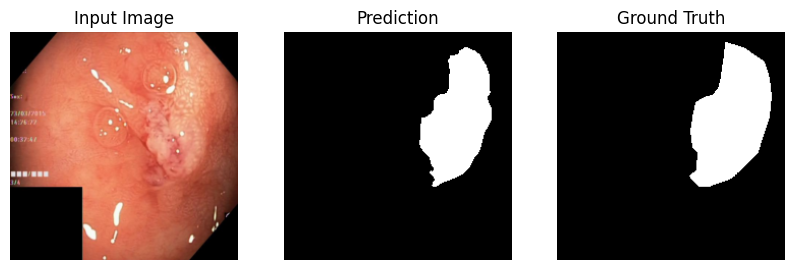

Epoch [18/50], Loss: 0.0215, IOU: 0.93, Val Loss: 0.2813, Val IOU: 0.78


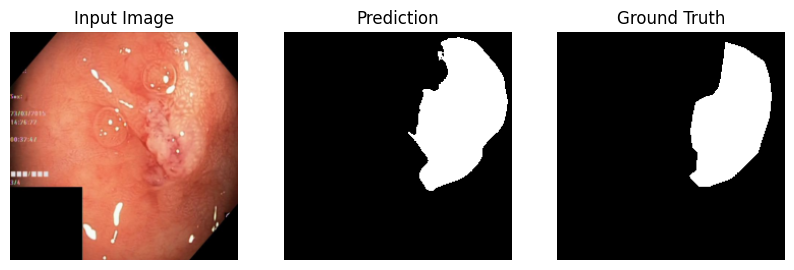

Epoch [19/50], Loss: 0.0216, IOU: 0.92, Val Loss: 0.2552, Val IOU: 0.76


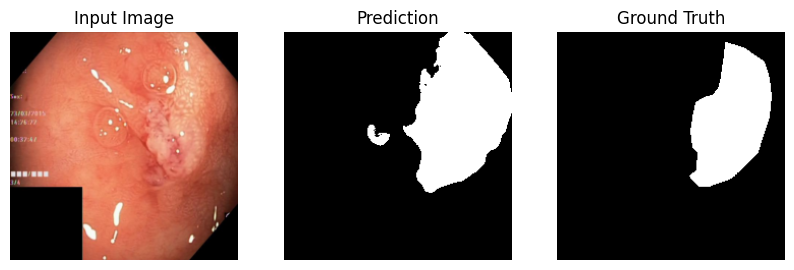

Epoch [20/50], Loss: 0.0243, IOU: 0.92, Val Loss: 0.2654, Val IOU: 0.78


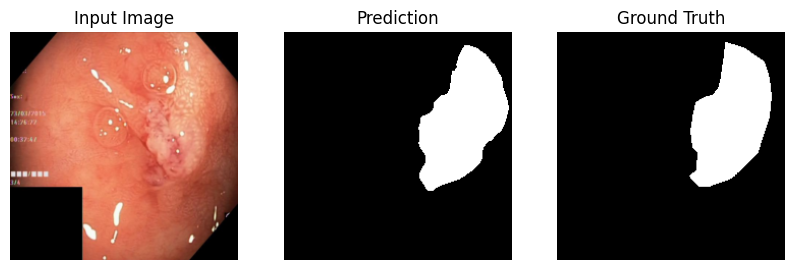

Epoch [21/50], Loss: 0.0263, IOU: 0.92, Val Loss: 0.2468, Val IOU: 0.78


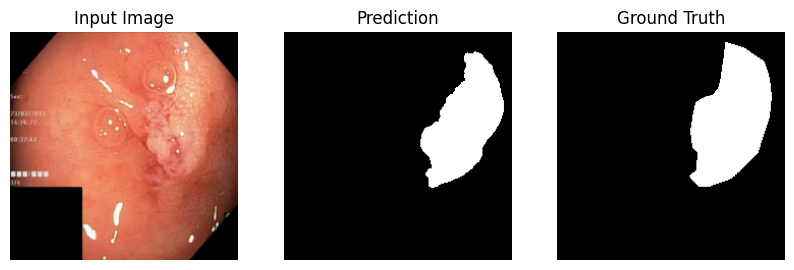

Epoch [22/50], Loss: 0.0238, IOU: 0.92, Val Loss: 0.2094, Val IOU: 0.73


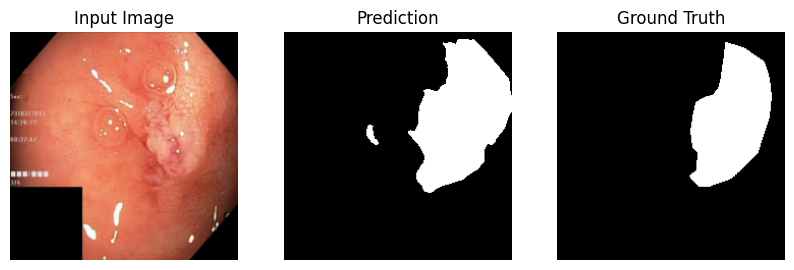

Epoch [23/50], Loss: 0.0233, IOU: 0.92, Val Loss: 0.1916, Val IOU: 0.75


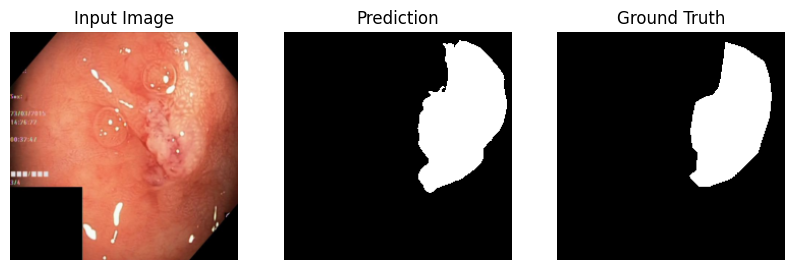

Epoch [24/50], Loss: 0.0209, IOU: 0.93, Val Loss: 0.2365, Val IOU: 0.79


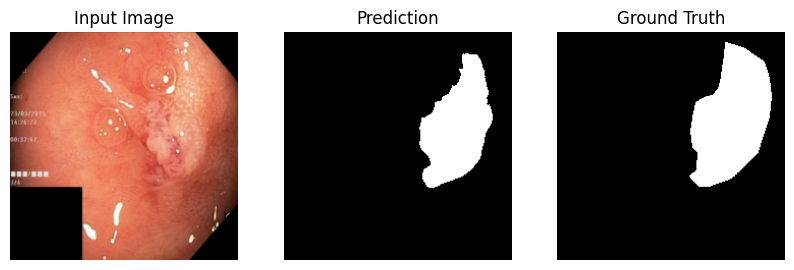

Epoch [25/50], Loss: 0.0191, IOU: 0.93, Val Loss: 0.3502, Val IOU: 0.78


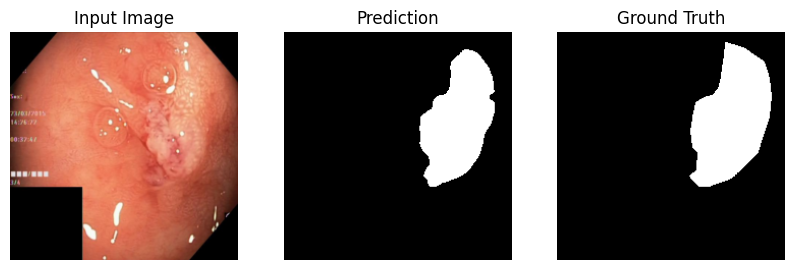

Epoch [26/50], Loss: 0.0180, IOU: 0.93, Val Loss: 0.3372, Val IOU: 0.78


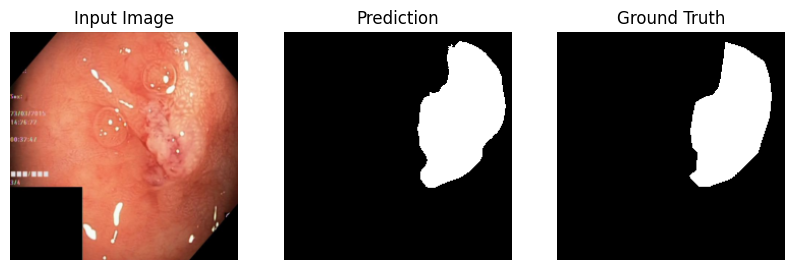

Epoch [27/50], Loss: 0.0159, IOU: 0.94, Val Loss: 0.2990, Val IOU: 0.78


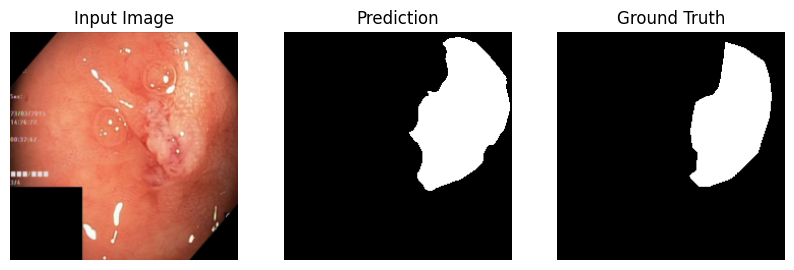

Epoch [28/50], Loss: 0.0142, IOU: 0.95, Val Loss: 0.3187, Val IOU: 0.77


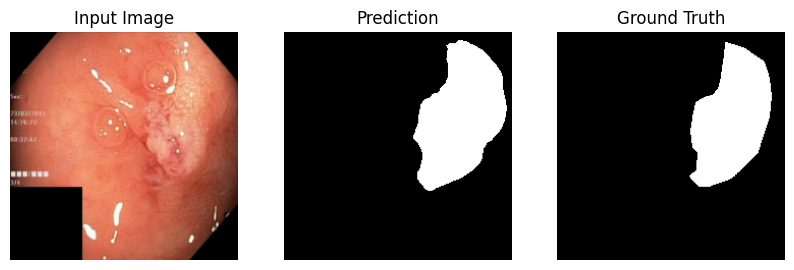

Epoch [29/50], Loss: 0.0132, IOU: 0.95, Val Loss: 0.3607, Val IOU: 0.78


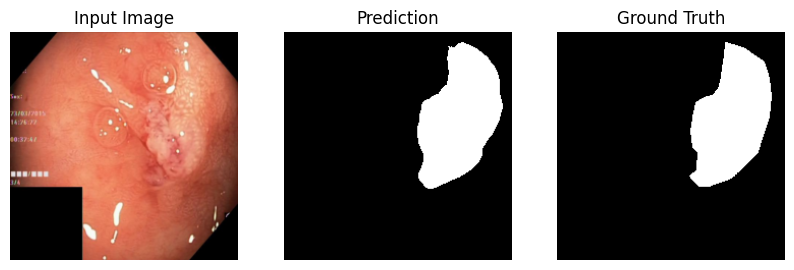

Epoch [30/50], Loss: 0.0126, IOU: 0.95, Val Loss: 0.4426, Val IOU: 0.78


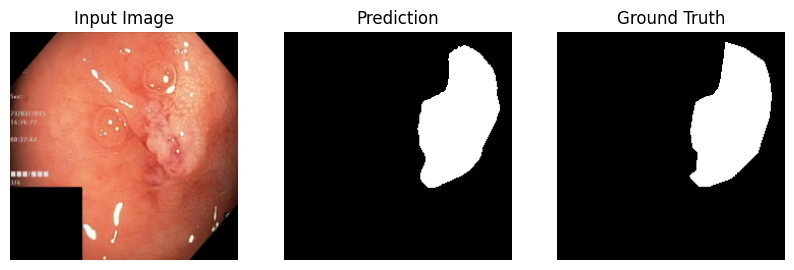

Epoch [31/50], Loss: 0.0125, IOU: 0.95, Val Loss: 0.4885, Val IOU: 0.78


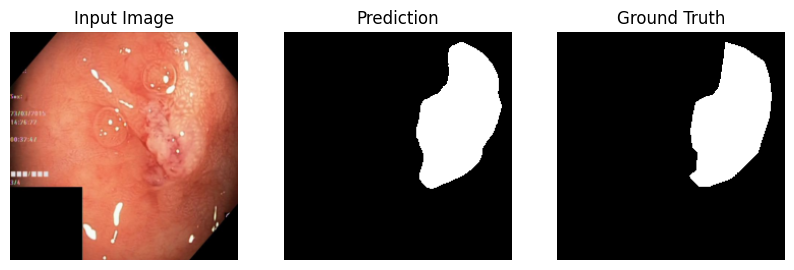

Epoch [32/50], Loss: 0.0132, IOU: 0.95, Val Loss: 0.4050, Val IOU: 0.78


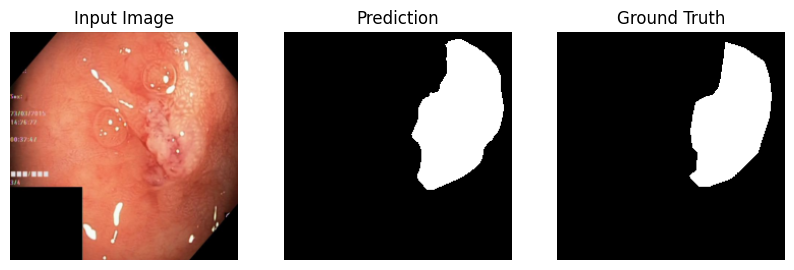

Epoch [33/50], Loss: 0.0147, IOU: 0.95, Val Loss: 0.3211, Val IOU: 0.77


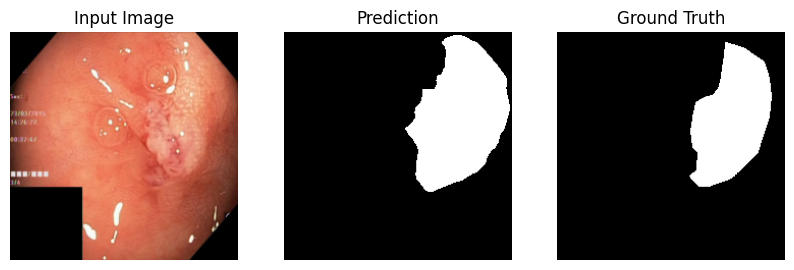

Epoch [34/50], Loss: 0.0151, IOU: 0.94, Val Loss: 0.3185, Val IOU: 0.77


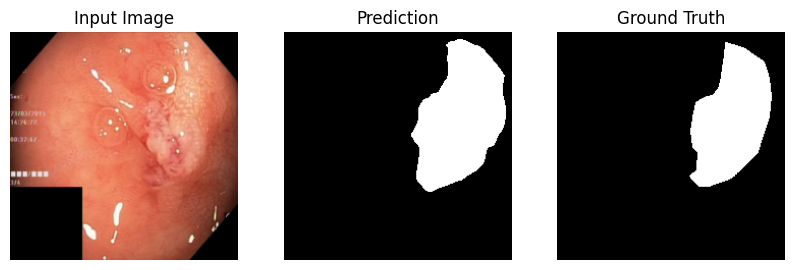

Epoch [35/50], Loss: 0.0157, IOU: 0.94, Val Loss: 0.3229, Val IOU: 0.78


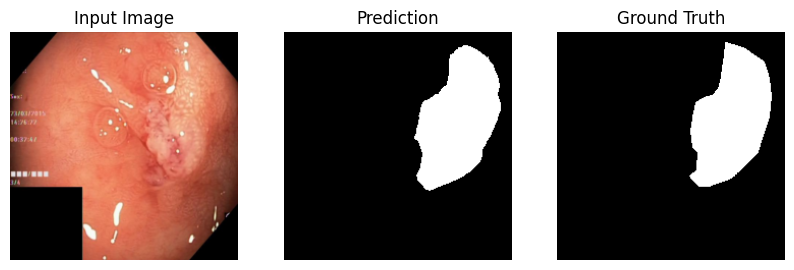

Epoch [36/50], Loss: 0.0158, IOU: 0.94, Val Loss: 0.2894, Val IOU: 0.79


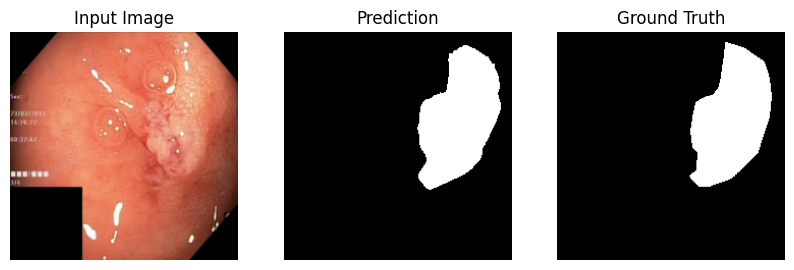

Epoch [37/50], Loss: 0.0152, IOU: 0.94, Val Loss: 0.4119, Val IOU: 0.77


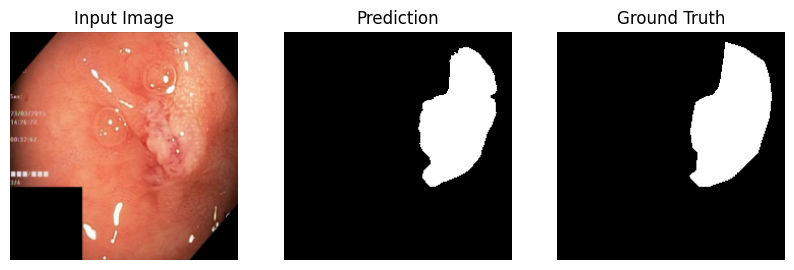

Epoch [38/50], Loss: 0.0154, IOU: 0.94, Val Loss: 0.4350, Val IOU: 0.78


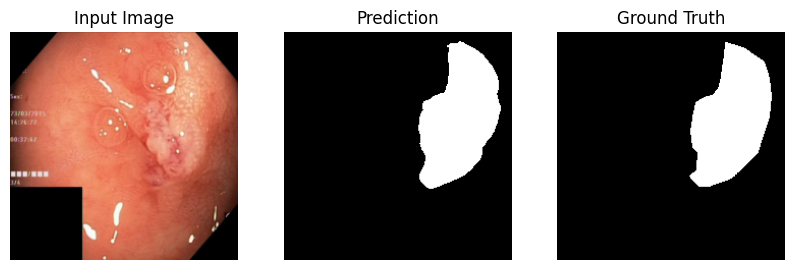

Epoch [39/50], Loss: 0.0149, IOU: 0.94, Val Loss: 0.3468, Val IOU: 0.78


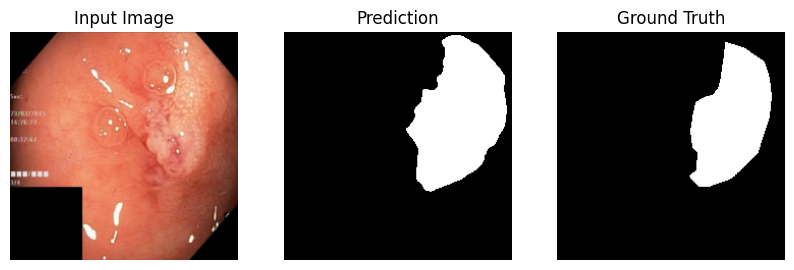

Epoch [40/50], Loss: 0.0141, IOU: 0.95, Val Loss: 0.3381, Val IOU: 0.78


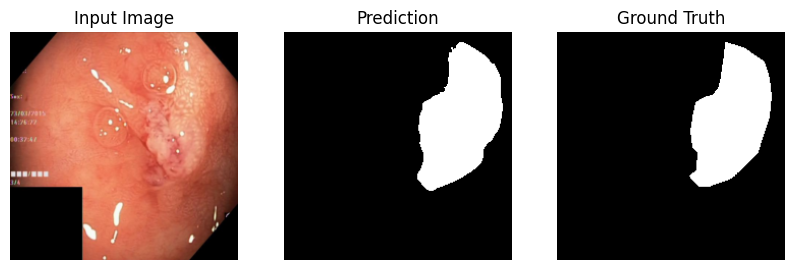

Epoch [41/50], Loss: 0.0121, IOU: 0.95, Val Loss: 0.4314, Val IOU: 0.79


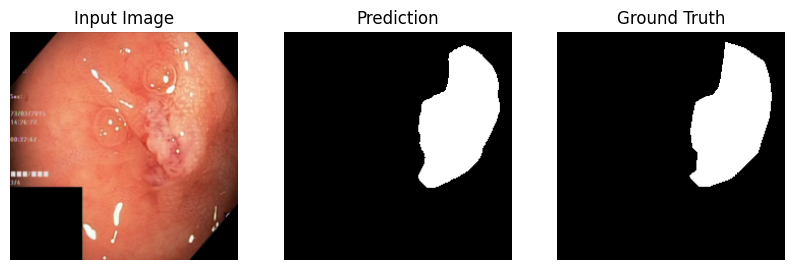

Epoch [42/50], Loss: 0.0110, IOU: 0.96, Val Loss: 0.5327, Val IOU: 0.79


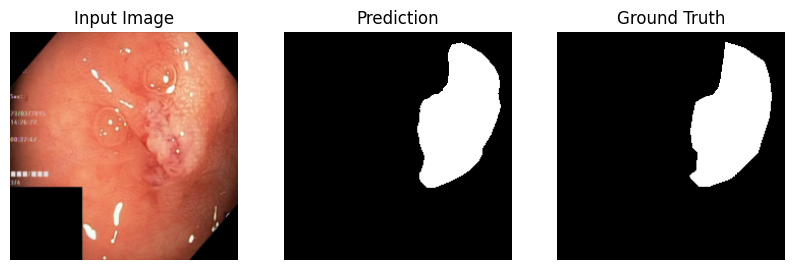

Epoch [43/50], Loss: 0.0107, IOU: 0.96, Val Loss: 0.4926, Val IOU: 0.79


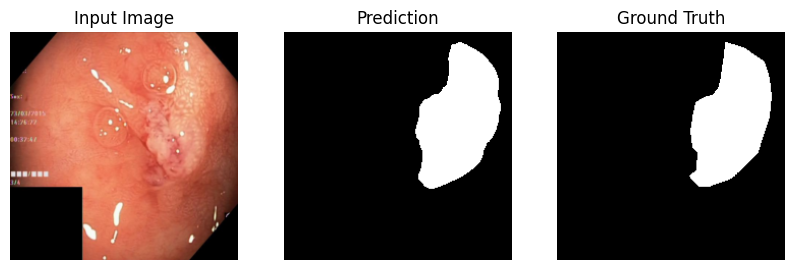

Epoch [44/50], Loss: 0.0108, IOU: 0.96, Val Loss: 0.4059, Val IOU: 0.79


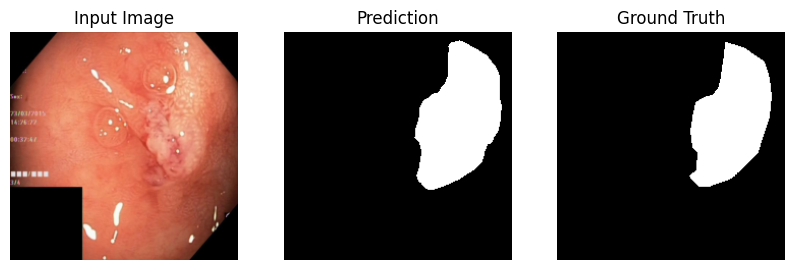

Epoch [45/50], Loss: 0.0112, IOU: 0.96, Val Loss: 0.4024, Val IOU: 0.76


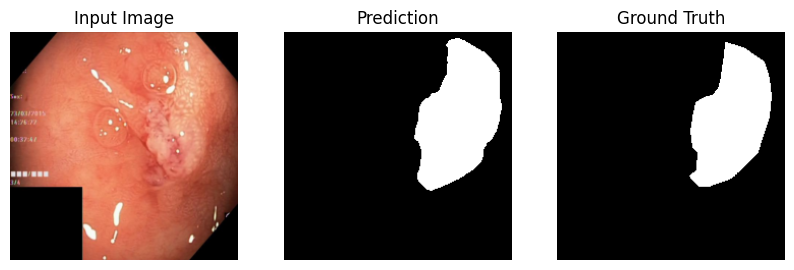

Epoch [46/50], Loss: 0.0116, IOU: 0.96, Val Loss: 0.4205, Val IOU: 0.79


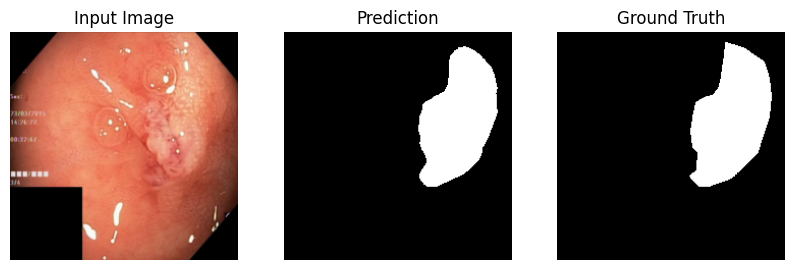

Epoch [47/50], Loss: 0.0123, IOU: 0.95, Val Loss: 0.5704, Val IOU: 0.77


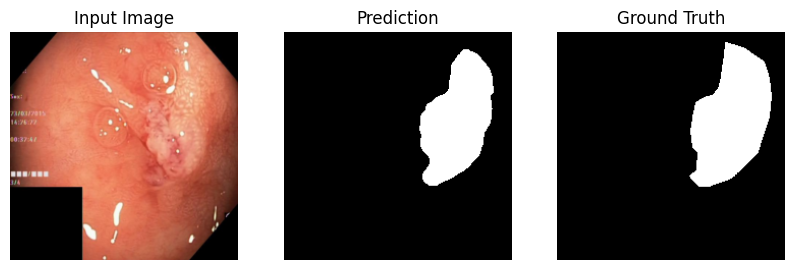

Epoch [48/50], Loss: 0.0125, IOU: 0.95, Val Loss: 0.5991, Val IOU: 0.77


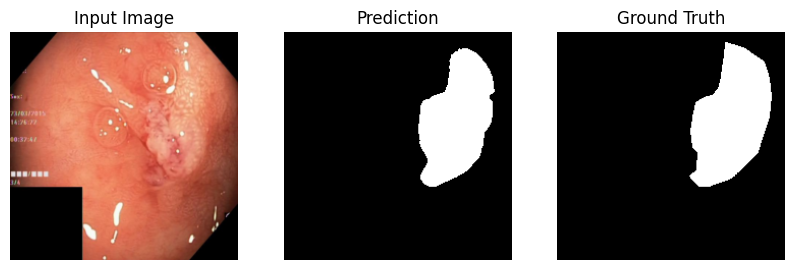

Epoch [49/50], Loss: 0.0126, IOU: 0.95, Val Loss: 0.4667, Val IOU: 0.78


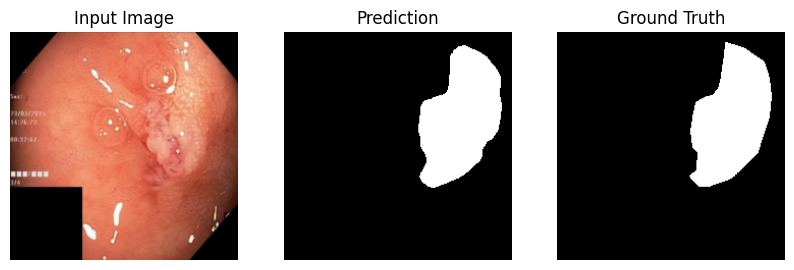

Epoch [50/50], Loss: 0.0122, IOU: 0.95, Val Loss: 0.4339, Val IOU: 0.79


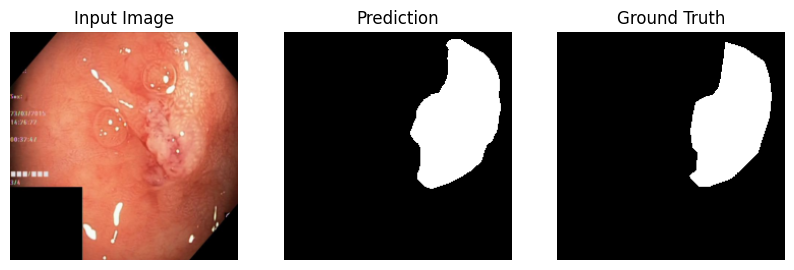

In [40]:
max_epoch = 50
lr = 4e-5
weight_decay = 1e-4
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay = weight_decay)
history_bce = train(model, train_loader, val_loader, criterion, optimizer, max_epoch, 'best_unet16_model.pth')

### Visualize training progress of Unet16 model

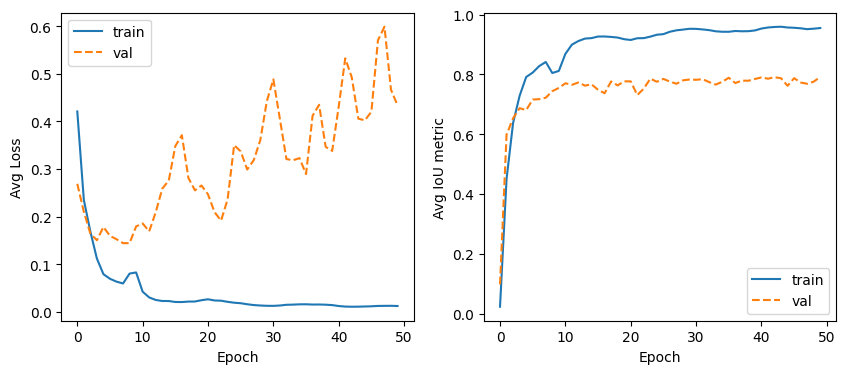

In [41]:
visualize_and_save(history_bce, 'history_bce_unet16')

In [42]:
model.load_state_dict(torch.load('best_unet16_model.pth'))

<All keys matched successfully>

### Calculate metric

In [43]:
val_iou_unet16 = round(score_model(model, iou_pytorch, val_loader),3)
test_iou_unet16 = round(score_model(model, iou_pytorch, test_loader),3)
val_dice_unet16 = round(score_model(model, dice_coefficient, val_loader),3)
test_dice_unet16 = round(score_model(model, dice_coefficient, test_loader),3)

# 6. Comparision

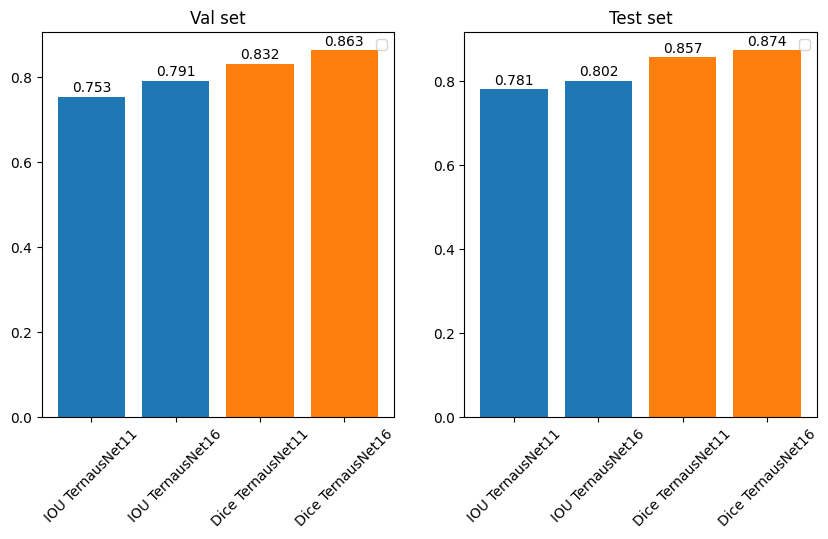

In [44]:
val = [val_iou_unet11, val_iou_unet16, val_dice_unet11, val_dice_unet16]
test = [test_iou_unet11, test_iou_unet16, test_dice_unet11, test_dice_unet16]
categories = ['IOU TernausNet11', 'IOU TernausNet16', 'Dice TernausNet11', 'Dice TernausNet16']
colors = ['C0', 'C0', 'C1', 'C1']

fig = plt.figure(figsize=(10, 5))

fig.add_subplot(1, 2, 1)
bars = plt.bar(categories, val, color=colors)
# Add the exact values on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.005, yval, ha='center', va='bottom')
plt.xticks(rotation=45)
plt.title('Val set')
plt.legend()

fig.add_subplot(1, 2, 2)
bars = plt.bar(categories, test, color=colors)
# Add the exact values on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.005, yval, ha='center', va='bottom')
plt.xticks(rotation=45)
plt.title('Test set')
plt.legend()

plt.show()